<a href="https://colab.research.google.com/github/teoalcdor/tfg_teoalcdor/blob/main/yolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# YOLO

Vamos a probar a implementar distintas versiones de YOLO para solucionar nuestro problema de detección de objetos. Para ello nos serviremos de la librería `ultralytics`, que nos proporciona un framework sobre el que es sencillo hacer aplicar transfer-learing a las distintas versiones de YOLO y predecir con los modelos resultantes.

## Librerías

Comenzamos instalando e importando las librerías necesarias:

In [ ]:
!pip install torch_summary
!pip install ultralytics
!pip install torchmetrics
!pip uninstall -y albumentations

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 94.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 108.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [ ]:
import cv2
from google.colab import drive
from google.colab.patches import cv2_imshow
import numpy as np
from matplotlib.colors import to_rgb
import matplotlib.pyplot as plt
import os
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import shutil
import tqdm
import time
import torch
from torch.utils.data import Dataset, DataLoader
from torchmetrics.detection import MeanAveragePrecision
from torchsummary import summary
from torchvision import transforms
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
%matplotlib inline
%load_ext tensorboard

Si podemos, utilizamos una GPU:

In [ ]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(DEVICE)

cuda


## Funciones Auxiliares y Otras Constantes

In [ ]:
label_encoder = LabelEncoder()
label_encoder.classes_ = np.array([
    "Tank (TANK)",
    "Infantry fighting vehicle (IFV)",
    "Armored personnel carrier (APC)",
    "Engineering vehicle (EV)",
    "Assault helicopter (AH)",
    "Transport helicopter (TH)",
    "Assault airplane (AAP)",
    "Transport airplane (TA)",
    "Anti-aircraft vehicle (AA)",
    "Towed artillery (TART)",
    "Self-propelled artillery (SPART)",
    "Human"
])


def create_class_colors(num_classes, seed):
    """
    Crea un diccionario con los colores de cada clase elegidos de forma
    aleatoria.
    """

    # Reproducibilidad
    np.random.seed(seed)

    # Inicializacion
    class_colors = {}

    # Para cada clase, creamos su color
    for i in range(num_classes):

        # Mientras no aceptemos el color creado para la clase, seguimos creando
        # colores
        not_accepted = True
        while not_accepted:

            # Elegimos el valor para cada canal
            r = np.random.randint(0, 255)
            g = np.random.randint(0, 255)
            b = np.random.randint(0, 255)

            # El color no debe ser muy gris
            not_gray = abs(r - g) > 50 or abs(r - b) > 50 and abs(g - b) > 50

            # El color no debe ser muy blanco
            not_white = r < 230 and g < 230 and b < 230

            # Si no es muy gris ni muy blanco, lo aceptamos
            if not_gray and not_white :
                not_accepted = False
                class_colors[i] = (r, g, b)

    return class_colors

CLASS_COLORS = create_class_colors(12, 123)


def decode_output_yolo(output, conf_threshold=0.5):
    """
    Decodifica la salida de YOLOv5 para que sea posible representarla y
    calcular la mAP.
    """

    # Extraemos las partes de la salida
    bbs = output[0].boxes.xyxy.to("cpu")
    confs = output[0].boxes.conf.to("cpu")
    labels = output[0].boxes.cls.to("cpu").int()

    # Nos quedamos con las detecciones que superen cierto umbral
    ixs = (confs > conf_threshold) & (labels != 11)

    # Filtramos las detecctiones
    bbs = bbs[ixs]
    confs = confs[ixs]
    labels = labels[ixs]

    return bbs, confs, labels


def plot_bbox(image, bbs, confs, labels, label_encoder=label_encoder,
              class_colors=CLASS_COLORS):
    """
    Dibuja unas detecciones a partir de la informacion de las cajas, confianzas
    y etiquetas.
    """

    for ix, bb in enumerate(bbs):

        # La etiqueta de la caja
        complete_label = \
            label_encoder.inverse_transform([labels[ix].item()])[0] + " - " +  \
            str(round(confs[ix].item(), 2))

        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.9
        font_thickness = 2
        text_size, _ = cv2.getTextSize(complete_label, font, font_scale, font_thickness)
        text_width, text_height = text_size

        # Tomamos medidas de la caja para centrar la etiqueta
        x0, y0, x1, y1 = bb
        x12 = (x0 + x1) / 2
        x2 = x12 - text_width / 2
        x3 = x12 + text_width / 2

        x0, y0 = int(x0), int(y0)
        x1, y1 = int(x1), int(y1)
        x2, x3 = int(x2), int(x3)

        # Pintamos caja y etiqueta
        bgr = class_colors[int(labels[ix].item())]
        image = cv2.rectangle(image, (x0, y0), (x1, y1), bgr, thickness=4)
        image = cv2.rectangle(image, (x2 - 20, y0), (x3 + 20, y0 - text_height - 20), bgr, -1)
        image = cv2.putText(image, complete_label, (x2, y0 - 10), font, 0.9, (255, 255, 255), 2)

    return image


@torch.no_grad()
def measure_fps_yolo(model, dataset):
    """
    Estima los FPS a los que detecta SSD300. Se tiene el cuenta el
    post-procesamiento.
    """

    n = len(dataset)

    # Cronometramos cuanto tardamos en detectar y procesar las detecciones de
    # todas las imagenes
    torch.cuda.synchronize()
    start_time = time.time()

    for data in dataset:
        output = model.predict(data[0], device=0, verbose = False)
        _ = decode_output_yolo(output)

    torch.cuda.synchronize()

    # Calculamos los FPS
    total_time = time.time() - start_time
    fps = n / total_time
    print(f"FPS: {fps:.2f}")

    return fps


@torch.no_grad()
def measure_map_yolo(model, dataset, iou_list=[0.5]):
    """
    Calcula el mAP a distintos umbrales y su media para SSD300.
    """

    map_dict = {}
    preds = []
    targets = []

    n = len(dataset)

    # Hacemos las detecciones sobre las imagenes y las ponemos en una lista con
    # el formato de la documentacion de MeanAveragePrecision.
    for data in tqdm.tqdm(dataset, total = n):
        image = data[0]

        output = model.predict(image, device=0, verbose = False)
        bbs, confs, labels = decode_output_yolo(output)

        preds.append({"boxes": bbs, "scores": confs, "labels": labels})

        true_bbs = torch.tensor(data[1], dtype=torch.float32)
        true_labels = torch.tensor(data[2])
        targets.append({"boxes": true_bbs, "labels": true_labels})

    # Calculamos la mAP a distintos umbrales
    for iou in iou_list:
        metric = MeanAveragePrecision(iou_thresholds=[iou])
        metric.update(preds, targets)
        results = metric.compute()
        map_dict[f"map@{iou}"] = results
        print(f"mAP@{iou}: {results['map']:.4f}")

    # Calculamos la media si se da mas de un umbral
    if len(iou_list) > 1:
        metric = MeanAveragePrecision(iou_thresholds=list(iou_list))
        metric.update(preds, targets)
        results = metric.compute()
        map_dict["map"] = results["map"]
        print(f"Average mAP: {results['map']:.4f}")
    return map_dict


def plot_training_results(results_path):
    """
    Representa la evolución de las pérdidas de YOLOv5 a lo largo del
    entrenamiento.
    """
    results = pd.read_csv(results_path)

    results["train_loss"] = results["train/box_loss"] + results["train/dfl_loss"] + results["train/cls_loss"]
    results["val_loss"] = results["val/box_loss"] + results["val/dfl_loss"] + results["val/cls_loss"]

    with sns.axes_style("whitegrid"):
        fig, axs = plt.subplots(4, 1, figsize=(3, 12))
        losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": results["train_loss"],
                "Validación": results["val_loss"],
            },
            ax = axs[0],
        )
        losses_plot.set(
            xlabel="Epochs",
            ylabel="Pérdida Total",
        )
        axs[0].set_xticks([0, 4, 9, 14, 19])
        axs[0].set_xticklabels([1, 5, 10, 15, 20])

        # Perdida de Clasificacion
        cls_losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": results["train/cls_loss"],
                "Validación": results["val/cls_loss"],
            },
            ax = axs[1],
        )
        cls_losses_plot.set(
            xlabel="Epochs",
            ylabel="Pérdida Clasificación",
        )
        axs[1].set_xticks([0, 4, 9, 14, 19])
        axs[1].set_xticklabels([1, 5, 10, 15, 20])

        # Perdida de Regresion de las Cajas
        box_losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": results["train/box_loss"],
                "Validación": results["val/box_loss"],
            },
            ax = axs[2],
        )
        box_losses_plot.set(
            xlabel="Epochs",
            ylabel="Pérdida de Regresión de las Cajas",
        )
        axs[2].set_xticks([0, 4, 9, 14, 19])
        axs[2].set_xticklabels([1, 5, 10, 15, 20])

        # Perdida de Distribucion Focal
        dfl_losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": results["train/dfl_loss"],
                "Validación": results["val/dfl_loss"],
            },
            ax = axs[3],
        )
        dfl_losses_plot.set(
            xlabel="Epochs",
            ylabel="Pérdida de Distribución Focal",
        )
        axs[3].set_xticks([0, 4, 9, 14, 19])
        axs[3].set_xticklabels([1, 5, 10, 15, 20])
        plt.tight_layout()
        plt.show()


def plot_all_training_results(results, augmented_results, augmented_humans_results, title):
    """
    Representa la evolución de las pérdidas de un determinado modelo YOLO a lo
    largo del entrenamiento para todas las configuraciones posibles.
    """

    # Extraemos los datos de las perdidas
    results["train_loss"] = \
        results["train/box_loss"] + \
        results["train/dfl_loss"] + \
        results["train/cls_loss"]
    results["val_loss"] = \
        results["val/box_loss"] + \
        results["val/dfl_loss"] + \
        results["val/cls_loss"]

    augmented_results["train_loss"] = \
        augmented_results["train/box_loss"] + \
        augmented_results["train/dfl_loss"] + \
        augmented_results["train/cls_loss"]
    augmented_results["val_loss"] = \
        augmented_results["val/box_loss"] + \
        augmented_results["val/dfl_loss"] + \
        augmented_results["val/cls_loss"]

    augmented_humans_results["train_loss"] = \
        augmented_humans_results["train/box_loss"] + \
        augmented_humans_results["train/dfl_loss"] + \
        augmented_humans_results["train/cls_loss"]
    augmented_humans_results["val_loss"] = \
        augmented_humans_results["val/box_loss"] + \
        augmented_humans_results["val/dfl_loss"] + \
        augmented_humans_results["val/cls_loss"]

    with sns.axes_style("whitegrid"):
        fig, axs = plt.subplots(4, 3, figsize=(9, 12))

        # Datos Originales
        losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": results["train_loss"],
                "Validación": results["val_loss"],
            },
            ax = axs[0, 0],
        )
        losses_plot.set_ylabel("Pérdida Total", fontsize=15)
        axs[0, 0].set_xticks([0, 4, 9, 14, 19])
        axs[0, 0].set_xticklabels([1, 5, 10, 15, 20])
        axs[0, 0].set_title("Datos Originales", fontsize=18)
        axs[0, 0].set_ylim([1.85, 4.6])

        cls_losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": results["train/cls_loss"],
                "Validación": results["val/cls_loss"],
            },
            ax = axs[1, 0],
        )
        cls_losses_plot.set_ylabel("Pérdida de\n Clasificación", fontsize=15)
        axs[1, 0].set_xticks([0, 4, 9, 14, 19])
        axs[1, 0].set_xticklabels([1, 5, 10, 15, 20])
        axs[1, 0].set_ylim([0.25, 1.5])

        box_losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": results["train/box_loss"],
                "Validación": results["val/box_loss"],
            },
            ax = axs[2, 0],
        )
        axs[2, 0].set_xticks([0, 4, 9, 14, 19])
        axs[2, 0].set_xticklabels([1, 5, 10, 15, 20])
        axs[2, 0].set_ylim([0.6, 1.75])
        box_losses_plot.set_ylabel("Pérdida de\n Regresión de las Cajas", fontsize=15)

        dfl_losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": results["train/dfl_loss"],
                "Validación": results["val/dfl_loss"],
            },
            ax = axs[3, 0],
        )
        axs[3, 0].set_xticks([0, 4, 9, 14, 19])
        axs[3, 0].set_xticklabels([1, 5, 10, 15, 20])
        axs[3, 0].set_ylim([0.9, 1.6])
        dfl_losses_plot.set_ylabel("Pérdida de\n Distribución Focal", fontsize=15)
        dfl_losses_plot.set_xlabel("Epochs", fontsize=15)

        # Data Augmentation
        losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": augmented_results["train_loss"],
                "Validación": augmented_results["val_loss"],
            },
            ax = axs[0, 1],
        )
        losses_plot.set(
            xlabel="",
            ylabel="",
        )
        axs[0, 1].set_xticks([0, 4, 9, 14, 19])
        axs[0, 1].set_xticklabels([1, 5, 10, 15, 20])
        axs[0, 1].set_title("Data Augmentation", fontsize=18)
        axs[0, 1].set_ylim([1.85, 4.6])

        cls_losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": augmented_results["train/cls_loss"],
                "Validación": augmented_results["val/cls_loss"],
            },
            ax = axs[1, 1],
        )
        axs[1, 1].set_xticks([0, 4, 9, 14, 19])
        axs[1, 1].set_xticklabels([1, 5, 10, 15, 20])
        axs[1, 1].set_ylim([0.25, 1.5])

        box_losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": augmented_results["train/box_loss"],
                "Validación": augmented_results["val/box_loss"],
            },
            ax = axs[2, 1],
        )
        box_losses_plot.set(
            xlabel="",
            ylabel="",
        )
        axs[2, 1].set_xticks([0, 4, 9, 14, 19])
        axs[2, 1].set_xticklabels([1, 5, 10, 15, 20])
        axs[2, 1].set_ylim([0.6, 1.75])

        dfl_losses_plot_augmented = sns.lineplot(
            data = {
                "Entrenamiento": augmented_results["train/dfl_loss"],
                "Validación": augmented_results["val/dfl_loss"],
            },
            ax = axs[3, 1],
        )
        dfl_losses_plot_augmented.set(
            xlabel="Epochs",
            ylabel="",
        )
        axs[3, 1].set_xticks([0, 4, 9, 14, 19])
        axs[3, 1].set_xticklabels([1, 5, 10, 15, 20])
        axs[3, 1].set_ylim([0.9, 1.6])
        dfl_losses_plot_augmented.set_xlabel("Epochs", fontsize=15)


        # Data Augmentation y Humanos
        losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": augmented_humans_results["train_loss"],
                "Validación": augmented_humans_results["val_loss"],
            },
            ax = axs[0, 2],
        )
        losses_plot.set(
            xlabel="",
            ylabel="",
        )
        axs[0, 2].set_xticks([0, 4, 9, 14, 19])
        axs[0, 2].set_xticklabels([1, 5, 10, 15, 20])
        axs[0, 2].set_title("Data Augmentation \ny Humanos", fontsize=18)
        axs[0, 2].set_ylim([1.85, 4.6])

        cls_losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": augmented_humans_results["train/cls_loss"],
                "Validación": augmented_humans_results["val/cls_loss"],
            },
            ax = axs[1, 2],
        )
        cls_losses_plot.set(
            xlabel="",
            ylabel="",
        )
        axs[1, 2].set_xticks([0, 4, 9, 14, 19])
        axs[1, 2].set_xticklabels([1, 5, 10, 15, 20])
        axs[1, 2].set_ylim([0.25, 1.5])

        box_losses_plot = sns.lineplot(
            data = {
                "Entrenamiento": augmented_humans_results["train/box_loss"],
                "Validación": augmented_humans_results["val/box_loss"],
            },
            ax = axs[2, 2],
        )
        box_losses_plot.set(
            xlabel="",
            ylabel="",
        )
        axs[2, 2].set_xticks([0, 4, 9, 14, 19])
        axs[2, 2].set_xticklabels([1, 5, 10, 15, 20])
        axs[2, 2].set_ylim([0.6, 1.75])

        dfl_losses_plot_augmented_humans = sns.lineplot(
            data = {
                "Entrenamiento": augmented_humans_results["train/dfl_loss"],
                "Validación": augmented_humans_results["val/dfl_loss"],
            },
            ax = axs[3, 2],
        )
        dfl_losses_plot_augmented_humans.set_xlabel("Epochs", fontsize=15)
        axs[3, 2].set_xticks([0, 4, 9, 14, 19])
        axs[3, 2].set_xticklabels([1, 5, 10, 15, 20])
        axs[3, 2].set_ylim([0.9, 1.6])

        fig.suptitle(title, fontsize=30)
        plt.tight_layout()
        plt.show()

CLASS_COLORS_GT = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'cyan', 'magenta', 'pink', 'brown', 'grey', 'darkgreen']
CLASS_COLORS_GT_RGB = [(255 * r, 255 * g, 255 * b) for r, g, b in [to_rgb(color) for color in CLASS_COLORS_GT]]
def plot_bbox_gt(img, bbs, classes, label_encoder=label_encoder,
                 class_colors=CLASS_COLORS_GT):

    w, h = img.shape[1], img.shape[0]

    for i, object_class in enumerate(classes):
        bb = bbs[i]
        label = label_encoder.inverse_transform([object_class])[0]
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.9
        font_thickness = 2
        text_size, _ = cv2.getTextSize(label, font, font_scale, font_thickness)
        text_width, text_height = text_size

        x0, y0, x1, y1 = bb
        x12 = (x0 + x1) / 2
        x2 = x12 - text_width / 2
        x3 = x12 + text_width / 2

        x0, y0 = int(x0), int(y0)
        x1, y1 = int(x1), int(y1)
        x2, x3 = int(x2), int(x3)

        bgr = [255 * i for i in to_rgb(class_colors[object_class])]
        print(bgr)
        img = cv2.rectangle(img, (x0, y0), (x1, y1), bgr, thickness=4)
        img = cv2.rectangle(img, (x2 - 20, y0), (x3 + 20, y0 - text_height - 20), bgr, -1)
        img = cv2.putText(img, label, (x2, y0 - 10), font, 0.9, (255, 255, 255), 2)

    return img

## Datos

Montamos nuestro Drive:

In [ ]:
drive.mount("/content/drive/")

Mounted at /content/drive/


Leemos las anotaciones en formato PascalVOC:

In [ ]:
train_annotations = pd.read_csv("/content/drive/MyDrive/tfg/datasets/od_dataset_pv_train.csv")
val_annotations = pd.read_csv("/content/drive/MyDrive/tfg/datasets/od_dataset_pv_val.csv")
test_annotations = pd.read_csv("/content/drive/MyDrive/tfg/datasets/od_dataset_pv_test.csv")

In [ ]:
len(train_annotations.filename.unique()), len(val_annotations.filename.unique()), len(test_annotations.filename.unique())

(11768, 1680, 3361)

Descomprimimos los datos:

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/datasets/object_detection_dataset_yolo.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

Extraemos el dataset con las imágenes originales con anotaciones están corruptas:

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/datasets/corrupt_object_detection_dataset.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

Extraemos el dataset con augmentations:

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/datasets/object_detection_dataset_yolo_augmented.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

Extraemos el dataset con anotaciones corruptas de las fotos originales y las augmentations:

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/datasets/corrupt_object_detection_dataset_augmented.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

Extraemos el dataset con augmentations e imágenes de personas:

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/datasets/object_detection_dataset_yolo_augmented_humans.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

Almacenamos los nombres de las imágenes originales con anotationes corruptas en conjuntos:

In [ ]:
corrupt_train_images = set()
corrupt_val_images = set()
corrupt_test_images = set()

# Entrenamiento
for image in os.listdir("/content/corrupt_object_detection_dataset/images/train/"):
    corrupt_train_images.add(image)

# Validacion
for image in os.listdir("/content/corrupt_object_detection_dataset/images/val/"):
    corrupt_val_images.add(image)

# Test
for image in os.listdir("/content/corrupt_object_detection_dataset/images/test/"):
    corrupt_test_images.add(image)


Almacenamos los nombres de las imágenes originales y con data augmentation con anotationes corruptas en conjuntos:

In [ ]:
corrupt_train_images_augmented = set()
corrupt_val_images_augmented = set()
corrupt_test_images_augmented = set()

# Entrenamiento
for image in os.listdir("/content/corrupt_object_detection_dataset_augmented/images/train/"):
    corrupt_train_images_augmented.add(image)

# Validacion
for image in os.listdir("/content/corrupt_object_detection_dataset_augmented/images/val/"):
    corrupt_val_images_augmented.add(image)

# Test
for image in os.listdir("/content/corrupt_object_detection_dataset_augmented/images/test/"):
    corrupt_test_images_augmented.add(image)


Creamos la clase del dataset de detección de objetos:

In [ ]:
class ObjectDetectionDataset(Dataset):
    def __init__(self, annotations, images_path, corrupt=set()):
        self.images_path = images_path
        self.annotations = annotations[~annotations["filename"].isin(corrupt)]
        self.filenames = self.annotations["filename"].unique()

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, ix):
        image_id = self.filenames[ix]
        image_path = f"{self.images_path}/{image_id}"
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        data = self.annotations[self.annotations["filename"] == image_id]

        labels = data["class"].values

        data = data[["xmin", "ymin", "xmax", "ymax"]].values
        boxes = data.astype(np.uint32)

        return img, boxes, labels

Instanciamos la clase para nuestros subconjuntos:

In [ ]:
# Entrenamiento
train_dataset = ObjectDetectionDataset(
    images_path="/content/object_detection_dataset_yolo/images/train/",
    annotations=train_annotations,
    corrupt=corrupt_train_images
)

# Validacion
val_dataset = ObjectDetectionDataset(
    images_path="/content/object_detection_dataset_yolo/images/val/",
    annotations=val_annotations,
    corrupt=corrupt_val_images
)

# Test
test_dataset = ObjectDetectionDataset(
    images_path="/content/object_detection_dataset_yolo/images/test/",
    annotations=test_annotations,
    corrupt=corrupt_test_images
)

Eliminamos las imágenes corruptas:

In [ ]:
# Conjuntos sin augmentations ni humanos
for image in corrupt_train_images: # Entrenamiento
    name = image[:-4]
    annotation = name + ".txt"
    os.remove(f"/content/object_detection_dataset_yolo/images/train/{image}")
    os.remove(f"/content/object_detection_dataset_yolo/labels/train/{annotation}")

for image in corrupt_val_images: # Validacion
    name = image[:-4]
    annotation = name + ".txt"
    os.remove(f"/content/object_detection_dataset_yolo/images/val/{image}")
    os.remove(f"/content/object_detection_dataset_yolo/labels/val/{annotation}")

for image in corrupt_test_images: # Test
    name = image[:-4]
    annotation = name + ".txt"
    os.remove(f"/content/object_detection_dataset_yolo/images/test/{image}")
    os.remove(f"/content/object_detection_dataset_yolo/labels/test/{annotation}")

# Conjuntos con data augmentation
for image in corrupt_train_images_augmented:
    name = image[:-4]
    annotation = name + ".txt"
    os.remove(f"/content/object_detection_dataset_yolo_augmented/images/train/{image}")
    os.remove(f"/content/object_detection_dataset_yolo_augmented/labels/train/{annotation}")

for image in corrupt_val_images_augmented:
    name = image[:-4]
    annotation = name + ".txt"
    os.remove(f"/content/object_detection_dataset_yolo_augmented/images/val/{image}")
    os.remove(f"/content/object_detection_dataset_yolo_augmented/labels/val/{annotation}")

for image in corrupt_test_images_augmented:
    name = image[:-4]
    annotation = name + ".txt"
    os.remove(f"/content/object_detection_dataset_yolo_augmented/images/test/{image}")
    os.remove(f"/content/object_detection_dataset_yolo_augmented/labels/test/{annotation}")

# Conjuntos con data augmentation y humanos
# (Aprovechamos que no hay etiquetas corruptas de humanos)
for image in corrupt_train_images_augmented:
    name = image[:-4]
    annotation = name + ".txt"
    os.remove(f"/content/object_detection_dataset_yolo_augmented_humans/images/train/{image}")
    os.remove(f"/content/object_detection_dataset_yolo_augmented_humans/labels/train/{annotation}")

for image in corrupt_val_images_augmented:
    name = image[:-4]
    annotation = name + ".txt"
    os.remove(f"/content/object_detection_dataset_yolo_augmented_humans/images/val/{image}")
    os.remove(f"/content/object_detection_dataset_yolo_augmented_humans/labels/val/{annotation}")

for image in corrupt_test_images_augmented:
    name = image[:-4]
    annotation = name + ".txt"
    os.remove(f"/content/object_detection_dataset_yolo_augmented_humans/images/test/{image}")
    os.remove(f"/content/object_detection_dataset_yolo_augmented_humans/labels/test/{annotation}")

Escribimos un documento YAML con información sobre nuestro dataset, lo que nos permitirá configurar el modelo para aplicar transfer-learning:

In [ ]:
%%writefile od_dataset.yaml

path: /content/object_detection_dataset_yolo/
train: images/train
val: images/val

# Classes
names:
  0: Tank (TANK)
  1: Infantry fighting vehicle (IFV)
  2: Armored personnel carrier (APC)
  3: Engineering vehicle (EV)
  4: Assault helicopter (AH)
  5: Transport helicopter (TH)
  6: Assault airplane (AAP)
  7: Transport airplane (TA)
  8: Anti-aircraft vehicle (AA)
  9: Towed artillery (TART)
  10: Self-propelled artillery (SPART)

augment: False

Writing od_dataset.yaml


In [ ]:
%%writefile od_dataset_augmented.yaml

path: /content/object_detection_dataset_yolo_augmented/
train: images/train
val: images/val

# Classes
names:
  0: Tank (TANK)
  1: Infantry fighting vehicle (IFV)
  2: Armored personnel carrier (APC)
  3: Engineering vehicle (EV)
  4: Assault helicopter (AH)
  5: Transport helicopter (TH)
  6: Assault airplane (AAP)
  7: Transport airplane (TA)
  8: Anti-aircraft vehicle (AA)
  9: Towed artillery (TART)
  10: Self-propelled artillery (SPART)

augment: False

Writing od_dataset_augmented.yaml


In [ ]:
%%writefile od_dataset_augmented_humans.yaml

path: /content/object_detection_dataset_yolo_augmented_humans/
train: images/train
val: images/val

# Classes
names:
  0: Tank (TANK)
  1: Infantry fighting vehicle (IFV)
  2: Armored personnel carrier (APC)
  3: Engineering vehicle (EV)
  4: Assault helicopter (AH)
  5: Transport helicopter (TH)
  6: Assault airplane (AAP)
  7: Transport airplane (TA)
  8: Anti-aircraft vehicle (AA)
  9: Towed artillery (TART)
  10: Self-propelled artillery (SPART)
  11: Person

augment: False

Writing od_dataset_augmented_humans.yaml


## Tensorboard

Para ir monitorizando los resultados del entrenamiento de forma interactiva utilizaremos TensorBoard. Comenzamos creando una ventana en nuestro notebook:

In [ ]:
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

Generamos un enlace para poder verlo en otra ventana del navegador por comodidad:

In [ ]:
from google.colab.output import eval_js
print(eval_js("google.colab.kernel.proxyPort(6006)"))

https://lr8nq19m8a-496ff2e9c6d22116-6006-colab.googleusercontent.com/


## YOLOv3

### Modelo

Cargamos nuestro modelo. Probaremos con YOLOv3, la versión mediana de la familia de modelos YOLOv5. Echamos un vistazo a su estructura:

In [ ]:
model = YOLO("yolov3.pt")
summary(model.model, torch.zeros(1, 3, 640, 640))

PRO TIP 💡 Replace 'model=yolov3.pt' with new 'model=yolov3u.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 198M/198M [00:01<00:00, 114MB/s]


Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1                          []                        --
|    └─Conv: 2-1                         [-1, 32, 640, 640]        --
|    |    └─Conv2d: 3-1                  [-1, 32, 640, 640]        (864)
|    |    └─BatchNorm2d: 3-2             [-1, 32, 640, 640]        (64)
|    |    └─SiLU: 3-3                    [-1, 32, 640, 640]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-4                    [-1, 32, 640, 640]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-5                    [-1, 32, 640, 640]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-6                    [-1, 32, 640, 640]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-7                    [-1, 32, 640, 640]        --
|    └─Con

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1                          []                        --
|    └─Conv: 2-1                         [-1, 32, 640, 640]        --
|    |    └─Conv2d: 3-1                  [-1, 32, 640, 640]        (864)
|    |    └─BatchNorm2d: 3-2             [-1, 32, 640, 640]        (64)
|    |    └─SiLU: 3-3                    [-1, 32, 640, 640]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-4                    [-1, 32, 640, 640]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-5                    [-1, 32, 640, 640]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-6                    [-1, 32, 640, 640]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-7                    [-1, 32, 640, 640]        --
|    └─Con

Entrenamos nuestro modelo con la configuración elegida:

### Entrenamiento en el Dataset Original

In [ ]:
model = YOLO("yolov3.pt")

PRO TIP 💡 Replace 'model=yolov3.pt' with new 'model=yolov3u.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



In [ ]:
results_yolov3 = model.train(
    data="/content/od_dataset.yaml",
    epochs=20,
    device=DEVICE,
    augment=False,
    optimizer='AdamW',
    lr0=1e-4,
    lrf=1.0,
    weight_decay=1e-5,
    momentum=0.9
)

Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov3.pt, data=/content/od_dataset.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=

100%|██████████| 755k/755k [00:00<00:00, 124MB/s]


Overriding model.yaml nc=80 with nc=11

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 1]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     37056  ultralytics.nn.modules.block.Bottleneck      [64, 64]                      
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    295680  ultralytics.nn.modules.block.Bottleneck      [128, 128]                    
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  8   4724736  ultralytics.nn.modules.block.Bottleneck      [256, 256]                    
  7                  -1  1   1180672  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 343MB/s]


AMP: checks passed ✅


train: Scanning /content/object_detection_dataset_yolo/labels/train... 11350 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11350/11350 [00:20<00:00, 548.94it/s]


train: New cache created: /content/object_detection_dataset_yolo/labels/train.cache


val: Scanning /content/object_detection_dataset_yolo/labels/val... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:03<00:00, 513.49it/s]

val: New cache created: /content/object_detection_dataset_yolo/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 84 weight(decay=0.0), 91 weight(decay=1e-05), 90 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      13.4G      1.567      1.317      1.529         20        640: 100%|██████████| 710/710 [08:27<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:19<00:00,  2.67it/s]

                   all       1627       3941      0.868      0.814      0.863      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      14.5G      1.256       0.77      1.342         40        640: 100%|██████████| 710/710 [08:13<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941       0.93      0.884      0.928      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      14.6G      1.132     0.6456      1.281         48        640: 100%|██████████| 710/710 [08:08<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.943      0.907      0.948      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      14.6G      1.036     0.5692      1.217         33        640: 100%|██████████| 710/710 [08:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.961      0.922      0.957      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20        15G     0.9755     0.5295      1.188         20        640: 100%|██████████| 710/710 [08:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.963      0.917       0.96      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      16.2G     0.9263     0.4898      1.159         38        640: 100%|██████████| 710/710 [08:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.963      0.933      0.966      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      16.2G     0.8862     0.4708      1.137         30        640: 100%|██████████| 710/710 [08:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.85it/s]

                   all       1627       3941      0.955      0.932      0.964      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      16.8G     0.8619     0.4476      1.126         22        640: 100%|██████████| 710/710 [08:05<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.966      0.935      0.968      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      17.5G     0.8307     0.4324      1.103         18        640: 100%|██████████| 710/710 [08:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.968      0.947      0.975      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      18.5G     0.8092     0.4232      1.091         28        640: 100%|██████████| 710/710 [08:05<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.968      0.943      0.973      0.764


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      18.5G     0.8227     0.4011      1.099          6        640: 100%|██████████| 710/710 [08:05<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.956      0.948      0.973      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      19.7G     0.8145     0.3962      1.094         16        640: 100%|██████████| 710/710 [08:04<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.81it/s]

                   all       1627       3941      0.966      0.947      0.975       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      19.7G      0.801     0.3855      1.088          8        640: 100%|██████████| 710/710 [08:04<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.969      0.949      0.976      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      20.3G     0.7805     0.3768      1.067         12        640: 100%|██████████| 710/710 [08:04<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.82it/s]

                   all       1627       3941       0.97      0.945      0.978      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      13.9G     0.7694     0.3694      1.071         35        640: 100%|██████████| 710/710 [08:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.971      0.953       0.98      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      13.9G     0.7543     0.3623      1.054         10        640: 100%|██████████| 710/710 [08:04<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.85it/s]

                   all       1627       3941      0.967      0.956       0.98      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      13.9G     0.7495     0.3613      1.051         11        640: 100%|██████████| 710/710 [08:04<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941       0.97      0.953       0.98      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      13.9G     0.7376     0.3549      1.048          7        640: 100%|██████████| 710/710 [08:04<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.85it/s]

                   all       1627       3941      0.968      0.954      0.983      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      14.2G     0.7306     0.3516       1.04          6        640: 100%|██████████| 710/710 [08:04<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.81it/s]

                   all       1627       3941       0.97       0.96      0.983      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      14.7G     0.7219     0.3456      1.039         14        640: 100%|██████████| 710/710 [08:04<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.971      0.959      0.985      0.797



20 epochs completed in 2.827 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 207.8MB
Optimizer stripped from runs/detect/train/weights/best.pt, 207.8MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv3 summary (fused): 96 layers, 103,672,721 parameters, 0 gradients, 282.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.69it/s]


                   all       1627       3941       0.97      0.959      0.985      0.798
           Tank (TANK)        288        663       0.98      0.982      0.994      0.831
Infantry fighting vehicle (IFV)        117        229      0.972      0.983      0.994      0.851
Armored personnel carrier (APC)        183        775      0.968      0.979      0.989      0.833
Engineering vehicle (EV)        245        280      0.997          1      0.995      0.902
Assault helicopter (AH)         84        242      0.937      0.909      0.964      0.626
Transport helicopter (TH)         83        116      0.965      0.959       0.99      0.706
Assault airplane (AAP)         80        115      0.964      0.933      0.979      0.693
Transport airplane (TA)        158        359      0.995      0.997      0.995      0.886
Anti-aircraft vehicle (AA)         56        153       0.98      0.964       0.99      0.897
Towed artillery (TART)        214        289      0.968      0.954      0.983    

#### Checkpoint

Comprimimos la carpeta runs creada de forma automática por el modelo y la guardamos en Drive. Esta carpeta, además de los resultados del entrenamiento y más información sobre el dataset, contiene el mejor de los modelos obtenidos durante el entrenamiento y el último obtenido.

In [ ]:
shutil.make_archive(
    "/content/runs",
    "zip",
    "/content",
    "runs"
)

'/content/runs.zip'

In [ ]:
shutil.copy(
    "/content/runs.zip",
    "/content/drive/MyDrive/tfg/runs_yolov3.zip"
)

'/content/drive/MyDrive/tfg/runs_yolov3.zip'

In [ ]:
shutil.rmtree("/content/runs")

#### Resultados

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov3.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

In [ ]:
model = YOLO("runs/detect/train/weights/best.pt")

##### Pérdida

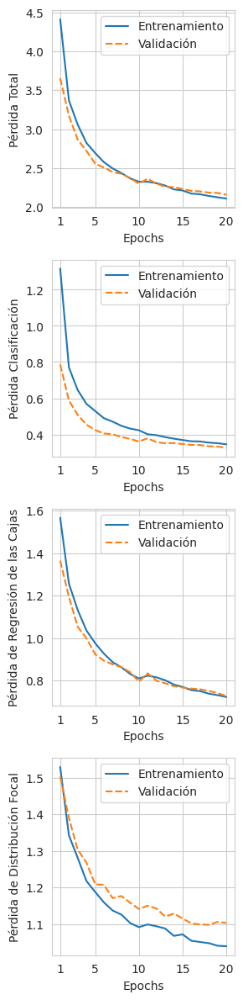

In [ ]:
plot_training_results("/content/runs/detect/train/results.csv")

##### Métricas

In [ ]:
_ = measure_fps_yolo(model, val_dataset)

FPS: 40.22


In [ ]:
_ = measure_map_yolo(model, val_dataset, iou_list=np.round(np.linspace(0.5, 0.95, 10), 2))

100%|██████████| 1627/1627 [00:35<00:00, 45.50it/s]


mAP@0.5: 0.8564
mAP@0.55: 0.8504
mAP@0.6: 0.8460
mAP@0.65: 0.8315
mAP@0.7: 0.8067
mAP@0.75: 0.7658
mAP@0.8: 0.6799
mAP@0.85: 0.5359
mAP@0.9: 0.2859
mAP@0.95: 0.0426
Average mAP: 0.6501


##### Probando el Modelo

Predecimos sobre una imagen del conjunto de validación:

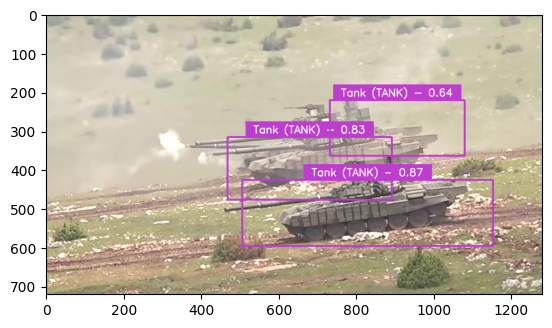

In [ ]:
image = val_dataset[0][0]
output = model.predict(image, device=0, verbose = False)
output = decode_output_yolo(output)
bbs, confs, labels = output
plot_bbox(image, bbs, confs, labels, class_colors=CLASS_COLORS)
plt.imshow(image)

In [ ]:
shutil.rmtree("/content/runs")

### Entrenamiento en el Dataset con Data Augmentation

In [ ]:
model = YOLO("yolov3.pt")

PRO TIP 💡 Replace 'model=yolov3.pt' with new 'model=yolov3u.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



In [ ]:
results_yolov3 = model.train(
    data="/content/od_dataset_augmented.yaml",
    epochs=20,
    device=DEVICE,
    augment=False,
    optimizer='AdamW',
    lr0=1e-4,
    lrf=1.0,
    weight_decay=1e-5,
    momentum=0.9
)

Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov3.pt, data=/content/od_dataset_augmented.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, s

train: Scanning /content/object_detection_dataset_yolo_augmented/labels/train... 22700 images, 0 backgrounds, 0 corrupt: 100%|██████████| 22700/22700 [00:54<00:00, 419.37it/s]


train: New cache created: /content/object_detection_dataset_yolo_augmented/labels/train.cache


val: Scanning /content/object_detection_dataset_yolo_augmented/labels/val... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:03<00:00, 420.36it/s]

val: New cache created: /content/object_detection_dataset_yolo_augmented/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 84 weight(decay=0.0), 91 weight(decay=1e-05), 90 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      15.5G      1.552      1.305       1.53         50        640: 100%|██████████| 1419/1419 [16:58<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.78it/s]

                   all       1627       3941      0.809      0.756      0.834      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20        16G      1.249     0.7651      1.338         52        640: 100%|██████████| 1419/1419 [16:40<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:22<00:00,  2.27it/s]

                   all       1627       3941      0.929      0.878      0.932      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20        16G      1.123     0.6365      1.268         71        640: 100%|██████████| 1419/1419 [16:39<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:19<00:00,  2.61it/s]

                   all       1627       3941      0.953      0.916      0.953       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      16.4G       1.04     0.5639      1.217         72        640: 100%|██████████| 1419/1419 [16:52<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:20<00:00,  2.52it/s]

                   all       1627       3941      0.957      0.932      0.959      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20        17G     0.9759     0.5135      1.174         50        640: 100%|██████████| 1419/1419 [16:37<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:21<00:00,  2.42it/s]

                   all       1627       3941      0.949      0.938      0.963      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      17.7G     0.9313      0.483      1.149         54        640: 100%|██████████| 1419/1419 [16:28<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:20<00:00,  2.52it/s]

                   all       1627       3941      0.961      0.936      0.967      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      18.3G     0.8993     0.4587      1.134         67        640: 100%|██████████| 1419/1419 [16:25<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:20<00:00,  2.52it/s]

                   all       1627       3941      0.962      0.943      0.971      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      18.8G     0.8712     0.4429       1.12         66        640: 100%|██████████| 1419/1419 [16:25<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:20<00:00,  2.54it/s]

                   all       1627       3941      0.971       0.94      0.977      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      19.3G     0.8455      0.427      1.099         58        640: 100%|██████████| 1419/1419 [16:26<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.967      0.945      0.978      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20        20G     0.8302      0.415      1.087         70        640: 100%|██████████| 1419/1419 [16:25<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:20<00:00,  2.53it/s]

                   all       1627       3941      0.961      0.952      0.978      0.787


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      13.2G     0.8532     0.3999      1.106         20        640: 100%|██████████| 1419/1419 [16:09<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.963       0.96      0.981      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      13.2G     0.8388      0.392      1.096         30        640: 100%|██████████| 1419/1419 [16:08<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.969      0.955      0.982      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      13.2G     0.8275     0.3839      1.089         28        640: 100%|██████████| 1419/1419 [16:08<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.969      0.962      0.983      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      13.7G     0.8076     0.3748      1.075         19        640: 100%|██████████| 1419/1419 [16:08<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.966      0.965      0.984      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      14.2G     0.7983     0.3687      1.079         17        640: 100%|██████████| 1419/1419 [16:08<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.968       0.96      0.984      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      14.7G     0.7877     0.3649      1.063         22        640: 100%|██████████| 1419/1419 [16:09<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.83it/s]

                   all       1627       3941      0.964      0.965      0.985      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      15.3G     0.7795      0.359      1.063         38        640: 100%|██████████| 1419/1419 [16:09<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.969      0.966      0.985      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      15.9G      0.766     0.3513      1.053         30        640: 100%|██████████| 1419/1419 [16:08<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.82it/s]

                   all       1627       3941       0.97      0.965      0.986      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      16.5G     0.7575     0.3472      1.051         36        640: 100%|██████████| 1419/1419 [16:08<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.972      0.965      0.986      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      17.2G     0.7514     0.3444      1.038         12        640: 100%|██████████| 1419/1419 [16:06<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.972      0.969      0.987      0.833



20 epochs completed in 5.587 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 207.8MB
Optimizer stripped from runs/detect/train/weights/best.pt, 207.8MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv3 summary (fused): 96 layers, 103,672,721 parameters, 0 gradients, 282.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.69it/s]


                   all       1627       3941      0.972      0.969      0.987      0.834
           Tank (TANK)        288        663      0.982      0.986      0.994      0.865
Infantry fighting vehicle (IFV)        117        229      0.974      0.984      0.994      0.884
Armored personnel carrier (APC)        183        775       0.98      0.983      0.992      0.869
Engineering vehicle (EV)        245        280      0.998          1      0.995      0.923
Assault helicopter (AH)         84        242      0.956      0.909      0.966      0.684
Transport helicopter (TH)         83        116      0.974      0.971      0.987      0.777
Assault airplane (AAP)         80        115      0.943      0.957      0.974      0.699
Transport airplane (TA)        158        359      0.995      0.997      0.995      0.919
Anti-aircraft vehicle (AA)         56        153      0.993      0.974      0.993      0.921
Towed artillery (TART)        214        289      0.962      0.974      0.991    

#### Checkpoint

Comprimimos la carpeta runs creada de forma automática por el modelo y la guardamos en Drive. Esta carpeta, además de los resultados del entrenamiento y más información sobre el dataset, contiene el mejor de los modelos obtenidos durante el entrenamiento y el último obtenido.

In [ ]:
shutil.make_archive(
    "/content/runs",
    "zip",
    "/content",
    "runs"
)

'/content/runs.zip'

In [ ]:
shutil.copy(
    "/content/runs.zip",
    "/content/drive/MyDrive/tfg/runs_yolov3_augmented.zip"
)

'/content/drive/MyDrive/tfg/runs_yolov3_augmented.zip'

In [ ]:
shutil.rmtree("/content/runs")

#### Resultados

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov3_augmented.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

In [ ]:
model = YOLO("runs/detect/train/weights/best.pt")

##### Pérdida

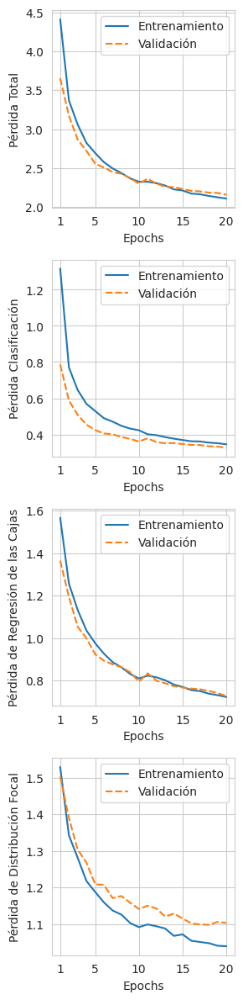

In [ ]:
plot_training_results("/content/runs/detect/train/results.csv")

##### Métricas

In [ ]:
_ = measure_fps_yolo(model, val_dataset)

FPS: 43.57


In [ ]:
_ = measure_map_yolo(model, val_dataset, iou_list=np.round(np.linspace(0.5, 0.95, 10), 2))

100%|██████████| 1627/1627 [00:36<00:00, 44.23it/s]


mAP@0.5: 0.6816
mAP@0.55: 0.6779
mAP@0.6: 0.6681
mAP@0.65: 0.6569
mAP@0.7: 0.6315
mAP@0.75: 0.5928
mAP@0.8: 0.5206
mAP@0.85: 0.3989
mAP@0.9: 0.2149
mAP@0.95: 0.0335
Average mAP: 0.5077


##### Probando el Modelo

Predecimos sobre una imagen del conjunto de validación:

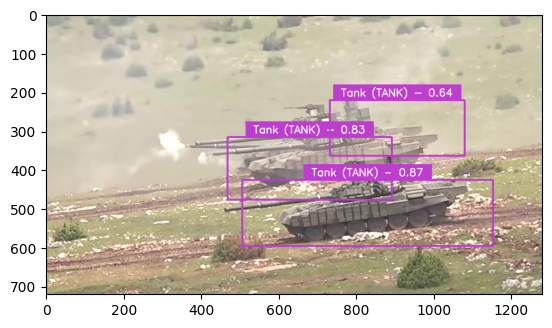

In [ ]:
image = val_dataset[0][0]
output = model.predict(image, device=0, verbose = False)
output = decode_output_yolo(output)
bbs, confs, labels = output
plot_bbox(image, bbs, confs, labels, class_colors=CLASS_COLORS)
plt.imshow(image)

In [ ]:
shutil.rmtree("/content/runs")

### Entrenamiento en el Dataset con Data Augmentation y Fotos de Humanos

In [ ]:
model = YOLO("yolov3.pt")

PRO TIP 💡 Replace 'model=yolov3.pt' with new 'model=yolov3u.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



In [ ]:
results_yolov3 = model.train(
    data="/content/od_dataset_augmented_humans.yaml",
    epochs=20,
    device=DEVICE,
    augment=False,
    optimizer='AdamW',
    lr0=1e-4,
    lrf=1.0,
    weight_decay=1e-5,
    momentum=0.9
)

Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov3.pt, data=/content/od_dataset_augmented_humans.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=

train: Scanning /content/object_detection_dataset_yolo_augmented_humans/labels/train... 23986 images, 0 backgrounds, 0 corrupt: 100%|██████████| 23986/23986 [00:59<00:00, 405.70it/s]


train: New cache created: /content/object_detection_dataset_yolo_augmented_humans/labels/train.cache


val: Scanning /content/object_detection_dataset_yolo_augmented_humans/labels/val... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:03<00:00, 413.69it/s]


val: New cache created: /content/object_detection_dataset_yolo_augmented_humans/labels/val.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 84 weight(decay=0.0), 91 weight(decay=1e-05), 90 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      15.2G      1.614      1.329      1.545          6        640: 100%|██████████| 1500/1500 [17:50<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.904      0.823      0.889      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      15.6G      1.328     0.8127      1.361         13        640: 100%|██████████| 1500/1500 [17:21<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.85it/s]

                   all       1627       3941      0.954      0.898      0.938      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      16.1G      1.204     0.6848      1.288         15        640: 100%|██████████| 1500/1500 [17:10<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.952       0.91       0.95      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      16.6G      1.125      0.613      1.252          5        640: 100%|██████████| 1500/1500 [17:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.85it/s]

                   all       1627       3941      0.943      0.935      0.963      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      17.2G      1.064     0.5633      1.209          2        640: 100%|██████████| 1500/1500 [17:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.954       0.94      0.966      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      17.8G       1.02     0.5308       1.19          9        640: 100%|██████████| 1500/1500 [17:07<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.85it/s]

                   all       1627       3941      0.959      0.943      0.973      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      18.4G     0.9887     0.5091      1.172          3        640: 100%|██████████| 1500/1500 [17:07<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.964      0.948      0.973      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20        19G     0.9575     0.4865      1.154         11        640: 100%|██████████| 1500/1500 [17:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.967      0.945      0.974       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      19.6G     0.9404     0.4751      1.142         10        640: 100%|██████████| 1500/1500 [17:07<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.963      0.943      0.974      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      13.1G     0.9182     0.4602      1.123         28        640: 100%|██████████| 1500/1500 [17:09<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.962      0.954      0.978      0.787


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      13.1G     0.9476     0.4539      1.145          3        640: 100%|██████████| 1500/1500 [17:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.963      0.956       0.98      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      13.5G     0.9252      0.433       1.13          6        640: 100%|██████████| 1500/1500 [17:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.959      0.961      0.981      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      13.9G     0.9112     0.4276      1.119         14        640: 100%|██████████| 1500/1500 [17:06<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.971      0.957      0.982        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      14.5G      0.906     0.4244      1.116          2        640: 100%|██████████| 1500/1500 [17:05<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.974      0.959      0.983      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20        15G      0.889     0.4122      1.106          2        640: 100%|██████████| 1500/1500 [17:05<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.969      0.963      0.984      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      15.9G     0.8757     0.4045      1.096          4        640: 100%|██████████| 1500/1500 [17:05<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.973      0.962      0.985      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      16.1G     0.8651     0.3994      1.087          4        640: 100%|██████████| 1500/1500 [17:03<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.971      0.963      0.985       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      17.1G      0.858     0.3964      1.082          3        640: 100%|██████████| 1500/1500 [17:02<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.84it/s]

                   all       1627       3941      0.968      0.966      0.985      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      17.3G     0.8489     0.3904      1.079          2        640: 100%|██████████| 1500/1500 [17:03<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.973      0.968      0.987      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      18.2G      0.841     0.3876      1.071          4        640: 100%|██████████| 1500/1500 [17:04<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:18<00:00,  2.83it/s]

                   all       1627       3941      0.974      0.968      0.987      0.832



20 epochs completed in 5.839 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 207.8MB
Optimizer stripped from runs/detect/train/weights/best.pt, 207.8MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv3 summary (fused): 96 layers, 103,673,492 parameters, 0 gradients, 282.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:19<00:00,  2.68it/s]


                   all       1627       3941       0.97      0.969      0.987      0.832
           Tank (TANK)        288        663      0.982      0.982      0.994      0.857
Infantry fighting vehicle (IFV)        117        229      0.973      0.983      0.993      0.881
Armored personnel carrier (APC)        183        775      0.968      0.987      0.992      0.867
Engineering vehicle (EV)        245        280      0.996          1      0.995      0.913
Assault helicopter (AH)         84        242      0.957      0.911      0.965      0.669
Transport helicopter (TH)         83        116      0.974       0.97      0.993      0.788
Assault airplane (AAP)         80        115      0.953      0.957      0.978      0.692
Transport airplane (TA)        158        359      0.995      0.997      0.995      0.923
Anti-aircraft vehicle (AA)         56        153      0.968      0.967      0.988       0.93
Towed artillery (TART)        214        289      0.962      0.976      0.988    

#### Checkpoint

Comprimimos la carpeta runs creada de forma automática por el modelo y la guardamos en Drive. Esta carpeta, además de los resultados del entrenamiento y más información sobre el dataset, contiene el mejor de los modelos obtenidos durante el entrenamiento y el último obtenido.

In [ ]:
shutil.make_archive(
    "/content/runs",
    "zip",
    "/content",
    "runs"
)

'/content/runs.zip'

In [ ]:
shutil.copy(
    "/content/runs.zip",
    "/content/drive/MyDrive/tfg/runs_yolov3_augmented_humans.zip"
)

'/content/drive/MyDrive/tfg/runs_yolov3_augmented_humans.zip'

In [ ]:
shutil.rmtree("/content/runs")

#### Resultados

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov3_augmented_humans.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

In [ ]:
model = YOLO("runs/detect/train/weights/best.pt")

##### Pérdida

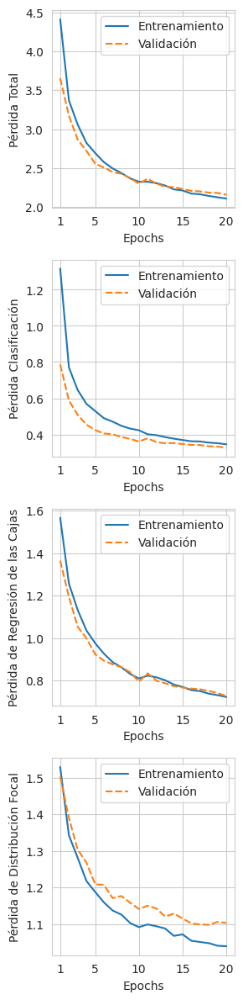

In [ ]:
plot_training_results("/content/runs/detect/train/results.csv")

##### Métricas

In [ ]:
_ = measure_fps_yolo(model, val_dataset)

FPS: 44.64


In [ ]:
_ = measure_map_yolo(model, val_dataset, iou_list=np.round(np.linspace(0.5, 0.95, 10), 2))

100%|██████████| 1627/1627 [00:35<00:00, 45.39it/s]


mAP@0.5: 0.6705
mAP@0.55: 0.6688
mAP@0.6: 0.6625
mAP@0.65: 0.6474
mAP@0.7: 0.6276
mAP@0.75: 0.5809
mAP@0.8: 0.5120
mAP@0.85: 0.3837
mAP@0.9: 0.1892
mAP@0.95: 0.0248
Average mAP: 0.4968


##### Probando el Modelo

Predecimos sobre una imagen del conjunto de validación:

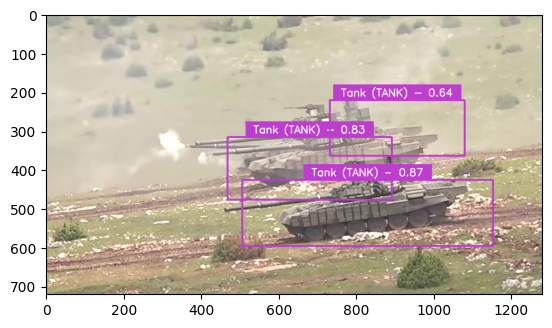

In [ ]:
image = val_dataset[0][0]
output = model.predict(image, device=0, verbose = False)
output = decode_output_yolo(output)
bbs, confs, labels = output
plot_bbox(image, bbs, confs, labels, class_colors=CLASS_COLORS)
plt.imshow(image)

In [ ]:
shutil.rmtree("/content/runs")

### Comparación de la Evolución de los modelos

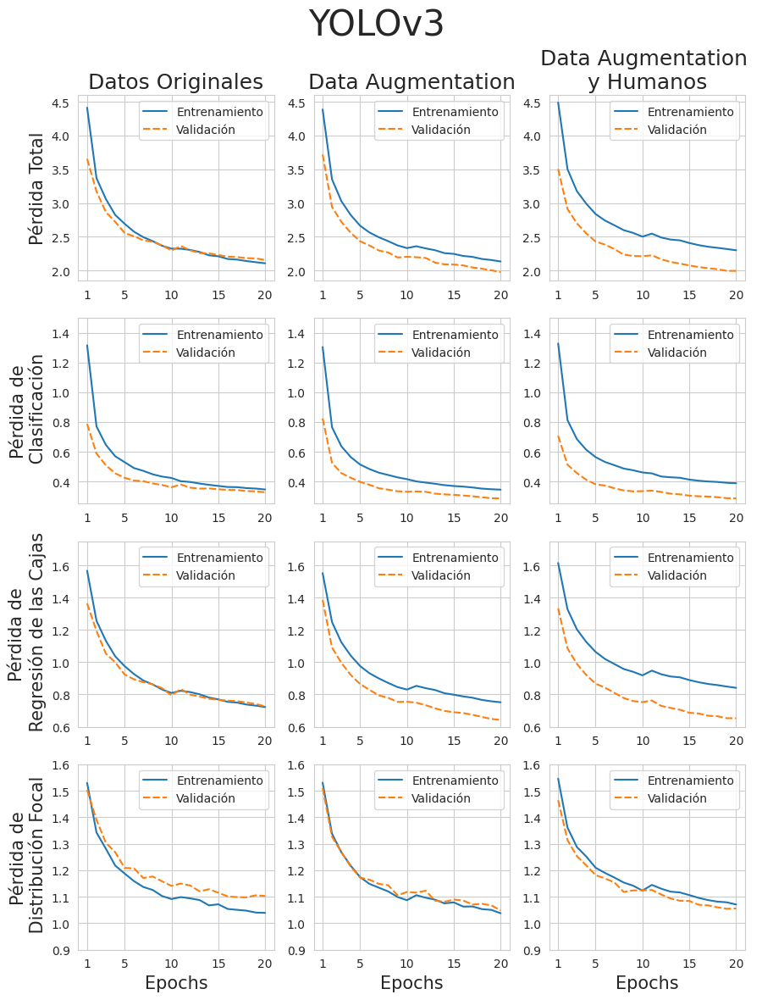

In [ ]:
# Sin data augmentation ni humanos
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov3.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"
yolov3_results = pd.read_csv("/content/runs/detect/train/results.csv")
shutil.rmtree("/content/runs")

# Con data augmentation
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov3_augmented.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"
yolov3_augmented_results = pd.read_csv("/content/runs/detect/train/results.csv")
shutil.rmtree("/content/runs")

# Con data augmentation y humanos
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov3_augmented_humans.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"
yolov3_augmented_humans_results = pd.read_csv("/content/runs/detect/train/results.csv")
shutil.rmtree("/content/runs")

plot_all_training_results(
    yolov3_results,
    yolov3_augmented_results,
    yolov3_augmented_humans_results,
    "YOLOv3"
)

## YOLOv5

### Modelo

Cargamos nuestro modelo. Probaremos con YOLOv5m, la versión mediana de la familia de modelos YOLOv5. Echamos un vistazo a su estructura:

In [ ]:
model = YOLO("yolov5m.pt")
summary(model.model, torch.zeros(1, 3, 640, 640))

PRO TIP 💡 Replace 'model=yolov5m.pt' with new 'model=yolov5mu.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 48.2M/48.2M [00:00<00:00, 532MB/s]


Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1                          []                        --
|    └─Conv: 2-1                         [-1, 48, 320, 320]        --
|    |    └─Conv2d: 3-1                  [-1, 48, 320, 320]        (5,184)
|    |    └─BatchNorm2d: 3-2             [-1, 48, 320, 320]        (96)
|    |    └─SiLU: 3-3                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-4                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-5                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-6                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-7                    [-1, 48, 320, 320]        --
|    └─C

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1                          []                        --
|    └─Conv: 2-1                         [-1, 48, 320, 320]        --
|    |    └─Conv2d: 3-1                  [-1, 48, 320, 320]        (5,184)
|    |    └─BatchNorm2d: 3-2             [-1, 48, 320, 320]        (96)
|    |    └─SiLU: 3-3                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-4                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-5                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-6                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-7                    [-1, 48, 320, 320]        --
|    └─C

Entrenamos nuestro modelo con la configuración elegida:

### Entrenamiento en el Dataset Original

In [ ]:
model = YOLO("yolov5m.pt")

PRO TIP 💡 Replace 'model=yolov5m.pt' with new 'model=yolov5mu.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 48.2M/48.2M [00:01<00:00, 44.7MB/s]


In [ ]:
results_yolov5 = model.train(
    data="/content/od_dataset.yaml",
    epochs=20,
    device=DEVICE,
    augment=False,
    optimizer='AdamW',
    lr0=1e-4,
    lrf=1.0,
    weight_decay=1e-5,
    momentum=0.9
)

Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov5m.pt, data=/content/od_dataset.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

train: Scanning /content/object_detection_dataset_yolo/labels/train.cache... 11350 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11350/11350 [00:00<?, ?it/s]
val: Scanning /content/object_detection_dataset_yolo/labels/val.cache... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 91 weight(decay=0.0), 98 weight(decay=1e-05), 97 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20        11G      1.621      1.423      1.401         20        640: 100%|██████████| 710/710 [03:30<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.23it/s]


                   all       1627       3941      0.885      0.802      0.866      0.518

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20        11G      1.327     0.8411      1.223         40        640: 100%|██████████| 710/710 [03:21<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.31it/s]


                   all       1627       3941      0.927       0.88      0.924      0.599

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20        11G      1.189     0.6924      1.156         48        640: 100%|██████████| 710/710 [03:18<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.24it/s]


                   all       1627       3941      0.943      0.902      0.943      0.645

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20        11G      1.089      0.619      1.107         33        640: 100%|██████████| 710/710 [03:17<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.27it/s]


                   all       1627       3941      0.954      0.834      0.921      0.651

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20        11G      1.032     0.5721       1.08         20        640: 100%|██████████| 710/710 [03:17<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.32it/s]


                   all       1627       3941       0.95      0.928      0.961      0.685

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20        11G     0.9839     0.5384      1.056         38        640: 100%|██████████| 710/710 [03:17<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.31it/s]


                   all       1627       3941      0.957      0.929      0.962      0.703

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20        11G     0.9521     0.5196      1.042         30        640: 100%|██████████| 710/710 [03:17<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.27it/s]


                   all       1627       3941      0.972      0.918      0.963       0.72

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20        11G     0.9211     0.4947       1.03         22        640: 100%|██████████| 710/710 [03:17<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.25it/s]


                   all       1627       3941      0.959      0.931      0.965      0.728

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20        11G      0.895     0.4794      1.018         18        640: 100%|██████████| 710/710 [03:17<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.29it/s]


                   all       1627       3941       0.96      0.932      0.968      0.732

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20        11G     0.8759     0.4657      1.015         28        640: 100%|██████████| 710/710 [03:17<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.25it/s]


                   all       1627       3941       0.97      0.929      0.969      0.737
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20        11G     0.8855     0.4443      1.012          6        640: 100%|██████████| 710/710 [03:17<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.26it/s]


                   all       1627       3941      0.962      0.935       0.97      0.722

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20        11G      0.869     0.4396      1.002         16        640: 100%|██████████| 710/710 [03:16<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.27it/s]


                   all       1627       3941      0.961       0.94      0.971       0.75

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20        11G     0.8475     0.4276     0.9947          8        640: 100%|██████████| 710/710 [03:17<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.29it/s]


                   all       1627       3941      0.967       0.94      0.974      0.757

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20        11G     0.8338     0.4183     0.9881         12        640: 100%|██████████| 710/710 [03:16<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.30it/s]

                   all       1627       3941      0.964      0.947      0.977      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20        11G     0.8225     0.4135     0.9858         35        640: 100%|██████████| 710/710 [03:16<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.29it/s]


                   all       1627       3941       0.97      0.943      0.977      0.761

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20        11G     0.8009     0.4024     0.9765         10        640: 100%|██████████| 710/710 [03:16<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.31it/s]

                   all       1627       3941      0.963      0.947      0.978      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20        11G     0.7953     0.3981     0.9742         11        640: 100%|██████████| 710/710 [03:16<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.20it/s]


                   all       1627       3941      0.959      0.954       0.98      0.775

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20        11G     0.7847     0.3942     0.9665          7        640: 100%|██████████| 710/710 [03:16<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.27it/s]

                   all       1627       3941      0.961      0.948       0.98      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20        11G     0.7783     0.3888     0.9649          6        640: 100%|██████████| 710/710 [03:16<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.30it/s]

                   all       1627       3941      0.958      0.952      0.981      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20        11G     0.7711     0.3843      0.965         14        640: 100%|██████████| 710/710 [03:16<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.28it/s]

                   all       1627       3941      0.969      0.951      0.981      0.784



20 epochs completed in 1.162 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 50.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 50.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv5m summary (fused): 106 layers, 25,051,585 parameters, 0 gradients, 64.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.66it/s]


                   all       1627       3941      0.968      0.953      0.981      0.783
           Tank (TANK)        288        663      0.992      0.977      0.994      0.806
Infantry fighting vehicle (IFV)        117        229      0.969      0.969      0.992      0.828
Armored personnel carrier (APC)        183        775      0.968      0.972      0.988      0.828
Engineering vehicle (EV)        245        280      0.998          1      0.995      0.878
Assault helicopter (AH)         84        242      0.904      0.895      0.948      0.591
Transport helicopter (TH)         83        116      0.965      0.955      0.987      0.735
Assault airplane (AAP)         80        115      0.954      0.909      0.971      0.664
Transport airplane (TA)        158        359      0.996      0.997      0.995      0.888
Anti-aircraft vehicle (AA)         56        153      0.983      0.961      0.984      0.864
Towed artillery (TART)        214        289       0.97      0.965      0.984    

#### Checkpoint

Comprimimos la carpeta runs creada de forma automática por el modelo y la guardamos en Drive. Esta carpeta, además de los resultados del entrenamiento y más información sobre el dataset, contiene el mejor de los modelos obtenidos durante el entrenamiento y el último obtenido.

In [ ]:
shutil.make_archive(
    "/content/runs",
    "zip",
    "/content",
    "runs"
)

'/content/runs.zip'

In [ ]:
shutil.copy(
    "/content/runs.zip",
    "/content/drive/MyDrive/tfg/runs_yolov5.zip"
)

'/content/drive/MyDrive/tfg/runs_yolov5.zip'

In [ ]:
shutil.rmtree("/content/runs")

#### Resultados

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov5.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

In [ ]:
model = YOLO("runs/detect/train/weights/best.pt")

##### Pérdida

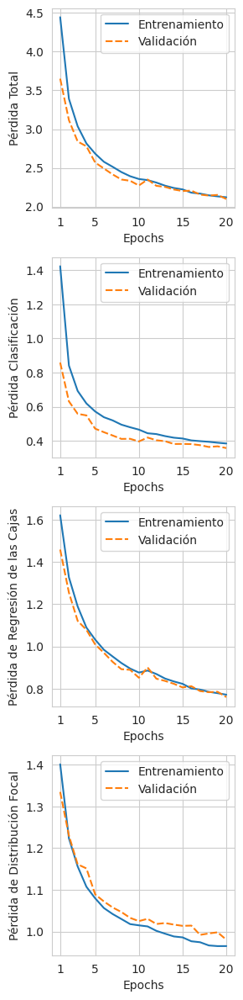

In [ ]:
plot_training_results("/content/runs/detect/train/results.csv")

##### Métricas

In [ ]:
_ = measure_fps_yolo(model, val_dataset)

FPS: 43.11


In [ ]:
_ = measure_map_yolo(model, val_dataset, iou_list=np.round(np.linspace(0.5, 0.95, 10), 2))

100%|██████████| 1627/1627 [00:34<00:00, 46.98it/s]


mAP@0.5: 0.8928
mAP@0.55: 0.8906
mAP@0.6: 0.8832
mAP@0.65: 0.8693
mAP@0.7: 0.8503
mAP@0.75: 0.8135
mAP@0.8: 0.7440
mAP@0.85: 0.6156
mAP@0.9: 0.3971
mAP@0.95: 0.1121
Average mAP: 0.7069


Como resulta ser el mejor modelo de detección, lo probamos también sobre el conjunto test:

In [ ]:
_ = measure_fps_yolo(model, test_dataset)

FPS: 40.20


In [ ]:
_ = measure_map_yolo(model, test_dataset, iou_list=np.round(np.linspace(0.5, 0.95, 10), 2))

100%|██████████| 3234/3234 [01:11<00:00, 45.53it/s]


mAP@0.5: 0.8073
mAP@0.55: 0.8032
mAP@0.6: 0.7951
mAP@0.65: 0.7765
mAP@0.7: 0.7473
mAP@0.75: 0.7040
mAP@0.8: 0.6191
mAP@0.85: 0.4721
mAP@0.9: 0.2494
mAP@0.95: 0.0282
Average mAP: 0.6002


##### Probando el Modelo

Predecimos sobre una imagen del conjunto de validación:

[165.0, 42.0, 42.0]
[165.0, 42.0, 42.0]
[255.0, 0.0, 255.0]
[128.0, 128.0, 128.0]
[255.0, 0.0, 0.0]


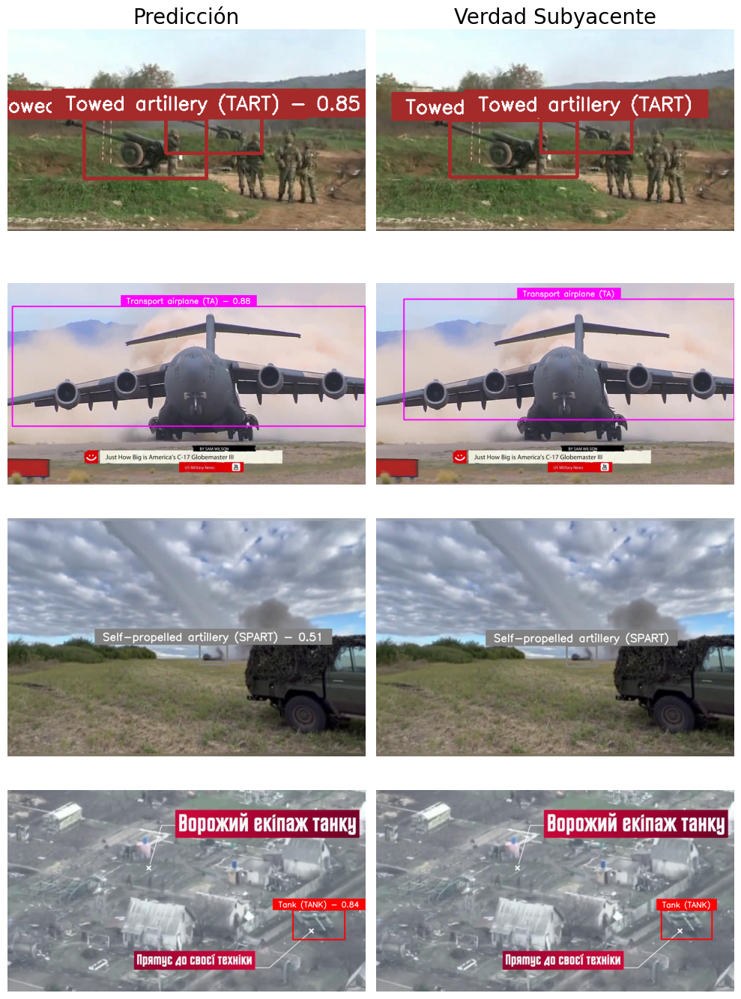

In [ ]:
img_2 = test_dataset[2][0]
output_2 = model.predict(img_2, device=0, verbose = False)
output_2 = decode_output_yolo(output_2)
bbs_2, confs_2, labels_2 = output_2
plot_bbox(img_2, bbs_2, confs_2, labels_2, class_colors=CLASS_COLORS)

img_4 = test_dataset[4][0]
output_4 = model.predict(img_4, device=0, verbose = False)
output_4 = decode_output_yolo(output_4)
bbs_4, confs_4, labels_4 = output_4
plot_bbox(img_4, bbs_4, confs_4, labels_4, class_colors=CLASS_COLORS)

img_6 = test_dataset[6][0]
output_6 = model.predict(img_6, device=0, verbose = False)
output_6 = decode_output_yolo(output_6)
bbs_6, confs_6, labels_6 = output_6
plot_bbox(img_6, bbs_6, confs_6, labels_6, class_colors=CLASS_COLORS)

img_102 = test_dataset[102][0]
output_102 = model.predict(img_102, device=0, verbose = False)
output_102 = decode_output_yolo(output_102)
bbs_102, confs_102, labels_102 = output_102
plot_bbox(img_102, bbs_102, confs_102, labels_102, class_colors=CLASS_COLORS)

img_2_gt, bbs_2_gt, classes_2_gt = test_dataset[2]
plot_bbox_gt(img_2_gt, bbs_2_gt, classes_2_gt)

img_4_gt, bbs_4_gt, classes_4_gt = test_dataset[4]
plot_bbox_gt(img_4_gt, bbs_4_gt, classes_4_gt)

img_6_gt, bbs_6_gt, classes_6_gt = test_dataset[6]
plot_bbox_gt(img_6_gt, bbs_6_gt, classes_6_gt)

img_102_gt, bbs_102_gt, classes_102_gt = test_dataset[102]
plot_bbox_gt(img_102_gt, bbs_102_gt, classes_102_gt)

fig, axs = plt.subplots(4, 2, figsize=(10, 14))
axs[0, 0].imshow(img_2)
axs[0, 0].axis('off')
axs[0, 0].set_title('Predicción', fontsize=20)

axs[1, 0].imshow(img_4)
axs[1, 0].axis('off')

axs[2, 0].imshow(img_6)
axs[2, 0].axis('off')

axs[3, 0].imshow(img_102)
axs[3, 0].axis('off')

axs[0, 1].imshow(img_2_gt)
axs[0, 1].axis('off')
axs[0, 1].set_title('Verdad Subyacente', fontsize=20)

axs[1, 1].imshow(img_4_gt)
axs[1, 1].axis('off')

axs[2, 1].imshow(img_6_gt)
axs[2, 1].axis('off')

axs[3, 1].imshow(img_102_gt)
axs[3, 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
shutil.rmtree("/content/runs")

### Entrenamiento en el Dataset con Data Augmentation

In [ ]:
model = YOLO("yolov5m.pt")

PRO TIP 💡 Replace 'model=yolov5m.pt' with new 'model=yolov5mu.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



In [ ]:
results_yolov5 = model.train(
    data="/content/od_dataset_augmented.yaml",
    epochs=20,
    device=DEVICE,
    augment=False,
    optimizer='AdamW',
    lr0=1e-4,
    lrf=1.0,
    weight_decay=1e-5,
    momentum=0.9
)

Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov5m.pt, data=/content/od_dataset_augmented.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, 

100%|██████████| 755k/755k [00:00<00:00, 113MB/s]


Overriding model.yaml nc=80 with nc=11

                   from  n    params  module                                       arguments                     
  0                  -1  1      5280  ultralytics.nn.modules.conv.Conv             [3, 48, 6, 2, 2]              
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2     65280  ultralytics.nn.modules.block.C3              [96, 96, 2]                   
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    444672  ultralytics.nn.modules.block.C3              [192, 192, 4]                 
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  6   2512896  ultralytics.nn.modules.block.C3              [384, 384, 6]                 
  7                  -1  1   2655744  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 275MB/s]


AMP: checks passed ✅


train: Scanning /content/object_detection_dataset_yolo_augmented/labels/train... 22700 images, 0 backgrounds, 0 corrupt: 100%|██████████| 22700/22700 [00:47<00:00, 480.25it/s]


train: New cache created: /content/object_detection_dataset_yolo_augmented/labels/train.cache


val: Scanning /content/object_detection_dataset_yolo_augmented/labels/val... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:03<00:00, 416.35it/s]

val: New cache created: /content/object_detection_dataset_yolo_augmented/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 91 weight(decay=0.0), 98 weight(decay=1e-05), 97 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      6.49G      1.642      1.449      1.433         50        640: 100%|██████████| 1419/1419 [06:51<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.73it/s]

                   all       1627       3941      0.859      0.809      0.873      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      7.16G      1.323     0.8523      1.225         52        640: 100%|██████████| 1419/1419 [06:37<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.44it/s]


                   all       1627       3941      0.928      0.877      0.927      0.615

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      7.22G       1.18     0.6948       1.15         71        640: 100%|██████████| 1419/1419 [06:32<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.42it/s]


                   all       1627       3941      0.945      0.913      0.948      0.671

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      7.28G      1.093     0.6168      1.101         72        640: 100%|██████████| 1419/1419 [06:30<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.36it/s]


                   all       1627       3941      0.951      0.926      0.954      0.689

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      7.34G      1.027     0.5632      1.071         50        640: 100%|██████████| 1419/1419 [06:30<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.40it/s]


                   all       1627       3941      0.966       0.92      0.962      0.709

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20       7.4G     0.9877     0.5326      1.054         54        640: 100%|██████████| 1419/1419 [06:30<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.43it/s]

                   all       1627       3941      0.959      0.935      0.964      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      7.46G     0.9548      0.513      1.039         67        640: 100%|██████████| 1419/1419 [06:31<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.37it/s]

                   all       1627       3941      0.952      0.942      0.967      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      7.52G     0.9287     0.4923      1.026         66        640: 100%|██████████| 1419/1419 [06:31<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.41it/s]


                   all       1627       3941      0.961      0.936      0.972      0.755

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      7.58G     0.9051     0.4768      1.013         58        640: 100%|██████████| 1419/1419 [06:31<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.37it/s]


                   all       1627       3941      0.971      0.935      0.974      0.766

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      7.64G     0.8892     0.4637      1.005         70        640: 100%|██████████| 1419/1419 [06:30<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.43it/s]

                   all       1627       3941      0.964      0.947      0.976      0.773


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20       7.7G     0.9019     0.4456      1.004         20        640: 100%|██████████| 1419/1419 [06:30<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.32it/s]

                   all       1627       3941      0.959      0.946      0.973      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      7.76G     0.8812     0.4301     0.9942         30        640: 100%|██████████| 1419/1419 [06:29<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.37it/s]

                   all       1627       3941      0.963      0.948      0.975      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      7.82G     0.8679     0.4234     0.9849         28        640: 100%|██████████| 1419/1419 [06:29<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.40it/s]

                   all       1627       3941       0.97      0.949      0.979      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      7.91G     0.8503     0.4115     0.9799         19        640: 100%|██████████| 1419/1419 [06:29<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.36it/s]

                   all       1627       3941      0.965      0.953      0.979      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20       8.3G     0.8375     0.4069     0.9741         17        640: 100%|██████████| 1419/1419 [06:29<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.36it/s]

                   all       1627       3941       0.97      0.954      0.982      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      8.36G     0.8286     0.4024     0.9693         22        640: 100%|██████████| 1419/1419 [06:29<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.39it/s]

                   all       1627       3941       0.97      0.956      0.982      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      8.42G     0.8223     0.3965     0.9661         38        640: 100%|██████████| 1419/1419 [06:29<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.30it/s]

                   all       1627       3941      0.967      0.963      0.983      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      8.48G     0.8097     0.3919     0.9612         30        640: 100%|██████████| 1419/1419 [06:28<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.37it/s]

                   all       1627       3941      0.966       0.96      0.983      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      8.61G     0.7992     0.3835      0.956         36        640: 100%|██████████| 1419/1419 [06:29<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.39it/s]

                   all       1627       3941       0.97      0.957      0.982      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      8.78G     0.7905     0.3816     0.9515         12        640: 100%|██████████| 1419/1419 [06:29<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.41it/s]

                   all       1627       3941      0.969      0.965      0.983      0.817



20 epochs completed in 2.236 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 50.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 50.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv5m summary (fused): 106 layers, 25,051,585 parameters, 0 gradients, 64.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.72it/s]


                   all       1627       3941      0.969      0.965      0.983      0.817
           Tank (TANK)        288        663      0.978      0.986      0.993      0.841
Infantry fighting vehicle (IFV)        117        229      0.972      0.987      0.993      0.865
Armored personnel carrier (APC)        183        775      0.973      0.978      0.992      0.856
Engineering vehicle (EV)        245        280      0.998          1      0.995      0.909
Assault helicopter (AH)         84        242       0.95      0.884      0.947      0.639
Transport helicopter (TH)         83        116      0.974      0.971      0.991      0.769
Assault airplane (AAP)         80        115      0.962      0.957      0.975      0.684
Transport airplane (TA)        158        359      0.996      0.997      0.995      0.918
Anti-aircraft vehicle (AA)         56        153      0.983      0.974       0.99      0.916
Towed artillery (TART)        214        289      0.941      0.969       0.98    

#### Checkpoint

Comprimimos la carpeta runs creada de forma automática por el modelo y la guardamos en Drive. Esta carpeta, además de los resultados del entrenamiento y más información sobre el dataset, contiene el mejor de los modelos obtenidos durante el entrenamiento y el último obtenido.

In [ ]:
shutil.make_archive(
    "/content/runs",
    "zip",
    "/content",
    "runs"
)

'/content/runs.zip'

In [ ]:
shutil.copy(
    "/content/runs.zip",
    "/content/drive/MyDrive/tfg/runs_yolov5_augmented.zip"
)

'/content/drive/MyDrive/tfg/runs_yolov5_augmented.zip'

In [ ]:
shutil.rmtree("/content/runs")

#### Resultados

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov5_augmented.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

In [ ]:
model = YOLO("runs/detect/train/weights/best.pt")

##### Pérdida

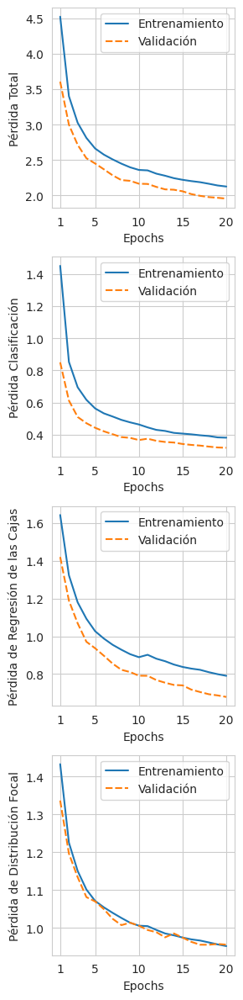

In [ ]:
plot_training_results("/content/runs/detect/train/results.csv")

##### Métricas

In [ ]:
_ = measure_fps_yolo(model, val_dataset)

FPS: 44.66


In [ ]:
_ = measure_map_yolo(model, val_dataset, iou_list=np.round(np.linspace(0.5, 0.95, 10), 2))

100%|██████████| 1627/1627 [00:36<00:00, 45.01it/s]


mAP@0.5: 0.7099
mAP@0.55: 0.7067
mAP@0.6: 0.6957
mAP@0.65: 0.6833
mAP@0.7: 0.6566
mAP@0.75: 0.6126
mAP@0.8: 0.5553
mAP@0.85: 0.4424
mAP@0.9: 0.2482
mAP@0.95: 0.0364
Average mAP: 0.5347


##### Probando el Modelo

Predecimos sobre una imagen del conjunto de validación:

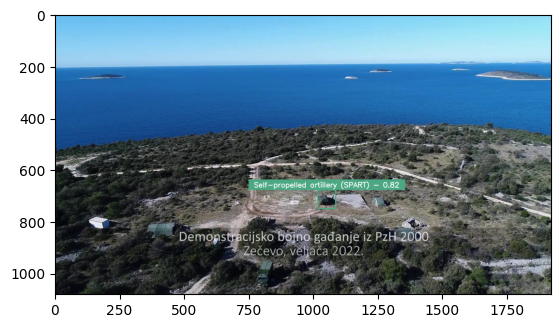

In [ ]:
image = val_dataset[0][0]
output = model.predict(image, device=0, verbose = False)
output = decode_output_yolo(output)
bbs, confs, labels = output
plot_bbox(image, bbs, confs, labels, class_colors=CLASS_COLORS)
plt.imshow(image)

In [ ]:
shutil.rmtree("/content/runs")

### Entrenamiento en el Dataset con Data Augmentation y Fotos de Humanos

In [ ]:
model = YOLO("yolov5m.pt")

PRO TIP 💡 Replace 'model=yolov5m.pt' with new 'model=yolov5mu.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



In [ ]:
results_yolov5 = model.train(
    data="/content/od_dataset_augmented_humans.yaml",
    epochs=20,
    device=DEVICE,
    augment=False,
    optimizer='AdamW',
    lr0=1e-4,
    lrf=1.0,
    weight_decay=1e-5,
    momentum=0.9
)

Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov5m.pt, data=/content/od_dataset_augmented_humans.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf

train: Scanning /content/object_detection_dataset_yolo_augmented_humans/labels/train... 23986 images, 0 backgrounds, 0 corrupt: 100%|██████████| 23986/23986 [00:41<00:00, 583.03it/s]


train: New cache created: /content/object_detection_dataset_yolo_augmented_humans/labels/train.cache


val: Scanning /content/object_detection_dataset_yolo_augmented_humans/labels/val... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:03<00:00, 442.81it/s]

val: New cache created: /content/object_detection_dataset_yolo_augmented_humans/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 91 weight(decay=0.0), 98 weight(decay=1e-05), 97 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      7.47G      1.704      1.509      1.427          6        640: 100%|██████████| 1500/1500 [07:16<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.15it/s]


                   all       1627       3941      0.801      0.769      0.839      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20       7.8G      1.409     0.9243      1.248         13        640: 100%|██████████| 1500/1500 [07:02<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.43it/s]

                   all       1627       3941      0.928      0.878      0.926      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20       7.8G      1.266     0.7646      1.173         15        640: 100%|██████████| 1500/1500 [06:56<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.32it/s]


                   all       1627       3941      0.943      0.916      0.952      0.669

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20       7.8G       1.18     0.6792      1.131          5        640: 100%|██████████| 1500/1500 [06:55<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.28it/s]


                   all       1627       3941       0.95      0.931      0.962      0.698

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20       7.8G       1.12     0.6249      1.098          2        640: 100%|██████████| 1500/1500 [06:53<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.39it/s]


                   all       1627       3941      0.954      0.931      0.963      0.713

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20       7.8G      1.076     0.5921      1.082          9        640: 100%|██████████| 1500/1500 [06:54<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.32it/s]

                   all       1627       3941      0.959      0.931      0.965      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20       7.8G      1.047     0.5692      1.066          3        640: 100%|██████████| 1500/1500 [06:54<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.16it/s]

                   all       1627       3941      0.951      0.949       0.97      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      7.95G      1.016     0.5459      1.054         11        640: 100%|██████████| 1500/1500 [06:55<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.44it/s]

                   all       1627       3941      0.973      0.935      0.973      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      7.99G     0.9997     0.5337      1.042         10        640: 100%|██████████| 1500/1500 [06:53<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.41it/s]


                   all       1627       3941      0.964      0.939      0.973      0.761

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      8.21G     0.9785     0.5153       1.03         28        640: 100%|██████████| 1500/1500 [06:52<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.40it/s]

                   all       1627       3941      0.971      0.944      0.976      0.768


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      8.27G     0.9926     0.4955      1.041          3        640: 100%|██████████| 1500/1500 [06:51<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.30it/s]

                   all       1627       3941      0.971      0.932      0.975      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      8.49G     0.9695      0.484      1.029          6        640: 100%|██████████| 1500/1500 [06:51<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.38it/s]

                   all       1627       3941      0.978      0.929      0.975       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      8.55G     0.9557     0.4727      1.021         14        640: 100%|██████████| 1500/1500 [06:51<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.42it/s]

                   all       1627       3941      0.967      0.951      0.978      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      8.77G     0.9476     0.4674       1.02          2        640: 100%|██████████| 1500/1500 [06:52<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.39it/s]

                   all       1627       3941      0.971      0.951       0.98       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      8.83G     0.9285     0.4563       1.01          2        640: 100%|██████████| 1500/1500 [07:00<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.12it/s]

                   all       1627       3941      0.968      0.958      0.982      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      8.89G     0.9162     0.4472      1.001          4        640: 100%|██████████| 1500/1500 [07:19<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.72it/s]

                   all       1627       3941      0.967      0.961      0.983      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20       9.1G     0.9116     0.4438     0.9972          4        640: 100%|██████████| 1500/1500 [07:27<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:11<00:00,  4.36it/s]


                   all       1627       3941      0.972      0.955      0.983      0.806

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      9.32G     0.8988     0.4376     0.9909          3        640: 100%|██████████| 1500/1500 [07:08<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.38it/s]

                   all       1627       3941      0.966      0.961      0.983       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      9.38G     0.8905      0.433     0.9917          2        640: 100%|██████████| 1500/1500 [07:16<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.33it/s]

                   all       1627       3941       0.97      0.956      0.984      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20       9.6G     0.8796     0.4285      0.984          4        640: 100%|██████████| 1500/1500 [07:21<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.87it/s]

                   all       1627       3941      0.972       0.96      0.985      0.817



20 epochs completed in 2.407 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 50.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 50.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv5m summary (fused): 106 layers, 25,052,164 parameters, 0 gradients, 64.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 2/51 [00:04<02:03,  2.51s/it]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:22<00:00,  2.24it/s]


                   all       1627       3941      0.972      0.953      0.977      0.813
           Tank (TANK)        288        663      0.984       0.98      0.994      0.846
Infantry fighting vehicle (IFV)        117        229      0.978      0.959      0.985      0.852
Armored personnel carrier (APC)        183        775      0.973      0.978      0.991      0.845
Engineering vehicle (EV)        245        280      0.998          1      0.995      0.916
Assault helicopter (AH)         84        242      0.961      0.819      0.876      0.606
Transport helicopter (TH)         83        116      0.971      0.966       0.99      0.769
Assault airplane (AAP)         80        115      0.948      0.946      0.972      0.691
Transport airplane (TA)        158        359      0.996      0.997      0.995      0.922
Anti-aircraft vehicle (AA)         56        153      0.993      0.974      0.993      0.905
Towed artillery (TART)        214        289       0.95      0.969      0.989    

#### Checkpoint

Comprimimos la carpeta runs creada de forma automática por el modelo y la guardamos en Drive. Esta carpeta, además de los resultados del entrenamiento y más información sobre el dataset, contiene el mejor de los modelos obtenidos durante el entrenamiento y el último obtenido.

In [ ]:
shutil.make_archive(
    "/content/runs",
    "zip",
    "/content",
    "runs"
)

'/content/runs.zip'

In [ ]:
shutil.copy(
    "/content/runs.zip",
    "/content/drive/MyDrive/tfg/runs_yolov5_augmented_humans.zip"
)

'/content/drive/MyDrive/tfg/runs_yolov5_augmented_humans.zip'

In [ ]:
shutil.rmtree("/content/runs")

#### Resultados

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov5_augmented_humans.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

In [ ]:
model = YOLO("runs/detect/train/weights/best.pt")

##### Pérdida

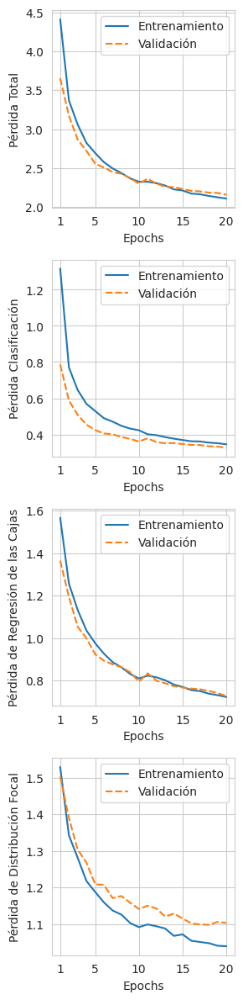

In [ ]:
plot_training_results("/content/runs/detect/train/results.csv")

##### Métricas

In [ ]:
_ = measure_fps_yolo(model, val_dataset)

FPS: 47.41


In [ ]:
_ = measure_map_yolo(model, val_dataset, iou_list=np.round(np.linspace(0.5, 0.95, 10), 2))

100%|██████████| 1627/1627 [00:34<00:00, 47.06it/s]


mAP@0.5: 0.6317
mAP@0.55: 0.6282
mAP@0.6: 0.6210
mAP@0.65: 0.6051
mAP@0.7: 0.5705
mAP@0.75: 0.5309
mAP@0.8: 0.4653
mAP@0.85: 0.3507
mAP@0.9: 0.1964
mAP@0.95: 0.0356
Average mAP: 0.4635


##### Probando el Modelo

Predecimos sobre una imagen del conjunto de validación:

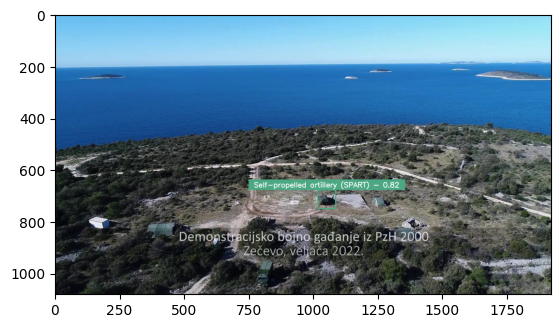

In [ ]:
image = val_dataset[0][0]
output = model.predict(image, device=0, verbose = False)
output = decode_output_yolo(output)
bbs, confs, labels = output
plot_bbox(image, bbs, confs, labels, class_colors=CLASS_COLORS)
plt.imshow(image)

In [ ]:
shutil.rmtree("/content/runs")

### Comparación de la Evolución de los modelos

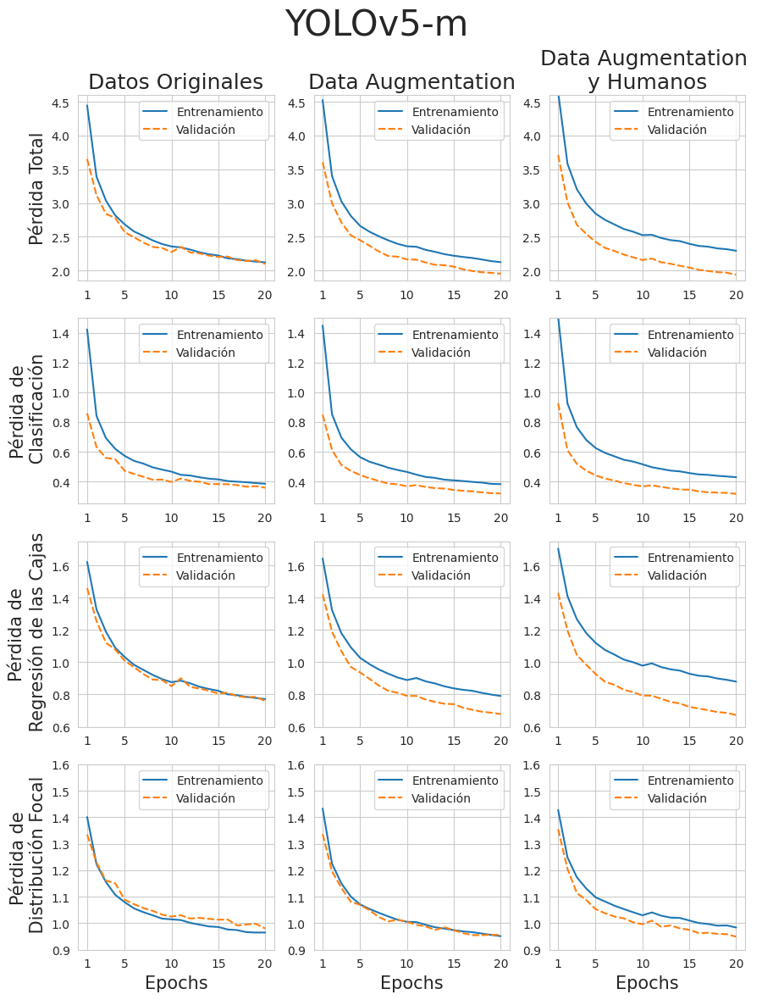

In [ ]:
# Sin data augmentation ni humanos
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov5.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"
yolov5_results = pd.read_csv("/content/runs/detect/train/results.csv")
shutil.rmtree("/content/runs")

# Con data augmentation
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov5_augmented.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"
yolov5_augmented_results = pd.read_csv("/content/runs/detect/train/results.csv")
shutil.rmtree("/content/runs")

# Con data augmentation y humanos
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov5_augmented_humans.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"
yolov5_augmented_humans_results = pd.read_csv("/content/runs/detect/train/results.csv")
shutil.rmtree("/content/runs")

plot_all_training_results(
    yolov5_results,
    yolov5_augmented_results,
    yolov5_augmented_humans_results,
    "YOLOv5-m"
)

## YOLOv8

### Modelo

Cargamos nuestro modelo. Probaremos con YOLOv5m, la versión mediana de la familia de modelos YOLOv5. Echamos un vistazo a su estructura:

In [ ]:
model = YOLO("yolov8m.pt")
summary(model.model, torch.zeros(1, 3, 640, 640))

100%|██████████| 49.7M/49.7M [00:00<00:00, 311MB/s]


Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1                          []                        --
|    └─Conv: 2-1                         [-1, 48, 320, 320]        --
|    |    └─Conv2d: 3-1                  [-1, 48, 320, 320]        (1,296)
|    |    └─BatchNorm2d: 3-2             [-1, 48, 320, 320]        (96)
|    |    └─SiLU: 3-3                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-4                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-5                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-6                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-7                    [-1, 48, 320, 320]        --
|    └─C

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1                          []                        --
|    └─Conv: 2-1                         [-1, 48, 320, 320]        --
|    |    └─Conv2d: 3-1                  [-1, 48, 320, 320]        (1,296)
|    |    └─BatchNorm2d: 3-2             [-1, 48, 320, 320]        (96)
|    |    └─SiLU: 3-3                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-4                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-5                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-6                    [-1, 48, 320, 320]        --
|    └─Conv: 2                           []                        --
|    |    └─SiLU: 3-7                    [-1, 48, 320, 320]        --
|    └─C

Entrenamos nuestro modelo con la configuración elegida:

### Entrenamiento en el Dataset Original

In [ ]:
model = YOLO("yolov8m.pt")

In [ ]:
results_yolov8 = model.train(
    data="/content/od_dataset.yaml",
    epochs=20,
    device=DEVICE,
    augment=False,
    optimizer='AdamW',
    lr0=1e-4,
    lrf=1.0,
    weight_decay=1e-5,
    momentum=0.9
)

Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/od_dataset.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

train: Scanning /content/object_detection_dataset_yolo/labels/train... 11350 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11350/11350 [00:21<00:00, 523.30it/s]


train: New cache created: /content/object_detection_dataset_yolo/labels/train.cache


val: Scanning /content/object_detection_dataset_yolo/labels/val... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:03<00:00, 517.92it/s]

val: New cache created: /content/object_detection_dataset_yolo/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=1e-05), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      7.38G      1.617      1.353      1.405         20        640: 100%|██████████| 710/710 [03:43<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.84it/s]


                   all       1627       3941      0.869      0.789       0.86       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      7.71G      1.293     0.7945      1.231         40        640: 100%|██████████| 710/710 [03:37<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.91it/s]


                   all       1627       3941      0.945      0.876      0.929      0.622

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      7.71G      1.154     0.6629      1.165         48        640: 100%|██████████| 710/710 [03:34<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.77it/s]


                   all       1627       3941      0.943      0.916      0.949      0.664

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      7.71G      1.059     0.5902      1.113         33        640: 100%|██████████| 710/710 [03:34<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:11<00:00,  4.55it/s]


                   all       1627       3941      0.943      0.924      0.952      0.691

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      7.71G     0.9996     0.5477      1.084         20        640: 100%|██████████| 710/710 [03:33<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.01it/s]


                   all       1627       3941      0.954      0.926      0.961      0.703

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      7.77G     0.9527     0.5143      1.061         38        640: 100%|██████████| 710/710 [03:33<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.96it/s]

                   all       1627       3941      0.964      0.924      0.966      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      7.87G     0.9198     0.4942      1.046         30        640: 100%|██████████| 710/710 [03:34<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.03it/s]


                   all       1627       3941      0.963      0.932      0.966      0.733

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      7.97G     0.8915     0.4733      1.032         22        640: 100%|██████████| 710/710 [03:33<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.92it/s]


                   all       1627       3941      0.974       0.93       0.97      0.737

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      8.07G     0.8648     0.4572      1.021         18        640: 100%|██████████| 710/710 [03:34<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.00it/s]


                   all       1627       3941      0.957      0.943      0.974      0.763

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      8.17G     0.8463     0.4466      1.016         28        640: 100%|██████████| 710/710 [03:33<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.04it/s]


                   all       1627       3941      0.963      0.935      0.972      0.747
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      8.17G     0.8524     0.4265       1.02          6        640: 100%|██████████| 710/710 [03:33<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.97it/s]


                   all       1627       3941      0.959      0.936      0.969      0.745

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      8.34G     0.8342      0.421      1.008         16        640: 100%|██████████| 710/710 [03:32<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.98it/s]


                   all       1627       3941       0.97      0.943      0.976      0.759

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      8.47G     0.8206     0.4068      1.003          8        640: 100%|██████████| 710/710 [03:32<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.07it/s]


                   all       1627       3941      0.969      0.935      0.974      0.768

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      8.64G     0.8026     0.3973     0.9948         12        640: 100%|██████████| 710/710 [03:32<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.01it/s]


                   all       1627       3941      0.966      0.945      0.977      0.765

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      8.76G     0.7929     0.3919     0.9944         35        640: 100%|██████████| 710/710 [03:33<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.00it/s]


                   all       1627       3941      0.971      0.951      0.978      0.778

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      8.92G     0.7794     0.3863     0.9854         10        640: 100%|██████████| 710/710 [03:33<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.00it/s]


                   all       1627       3941      0.971       0.95      0.981      0.784

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      9.05G     0.7733       0.38      0.983         11        640: 100%|██████████| 710/710 [03:32<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.02it/s]


                   all       1627       3941      0.968      0.955      0.981      0.781

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      9.21G     0.7602     0.3726     0.9802          7        640: 100%|██████████| 710/710 [03:32<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.97it/s]


                   all       1627       3941      0.963      0.955       0.98      0.788

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      9.34G     0.7562     0.3696     0.9744          6        640: 100%|██████████| 710/710 [03:32<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.98it/s]


                   all       1627       3941      0.967      0.952      0.981      0.786

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      9.53G     0.7429     0.3642     0.9699         14        640: 100%|██████████| 710/710 [03:32<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.03it/s]


                   all       1627       3941       0.97      0.953      0.982      0.795

20 epochs completed in 1.254 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 92 layers, 25,846,129 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:11<00:00,  4.44it/s]


                   all       1627       3941       0.97      0.954      0.982      0.795
           Tank (TANK)        288        663      0.992      0.977      0.994      0.834
Infantry fighting vehicle (IFV)        117        229      0.974      0.974      0.993       0.85
Armored personnel carrier (APC)        183        775      0.969      0.973       0.99      0.833
Engineering vehicle (EV)        245        280      0.997          1      0.995      0.883
Assault helicopter (AH)         84        242      0.927      0.893      0.949      0.619
Transport helicopter (TH)         83        116      0.965      0.959      0.979      0.732
Assault airplane (AAP)         80        115      0.972      0.903      0.966      0.657
Transport airplane (TA)        158        359      0.987      0.997      0.995      0.903
Anti-aircraft vehicle (AA)         56        153      0.985      0.967      0.991      0.884
Towed artillery (TART)        214        289      0.963      0.958      0.986    

#### Checkpoint

Comprimimos la carpeta runs creada de forma automática por el modelo y la guardamos en Drive. Esta carpeta, además de los resultados del entrenamiento y más información sobre el dataset, contiene el mejor de los modelos obtenidos durante el entrenamiento y el último obtenido.

In [ ]:
shutil.make_archive(
    "/content/runs",
    "zip",
    "/content",
    "runs"
)

'/content/runs.zip'

In [ ]:
shutil.copy(
    "/content/runs.zip",
    "/content/drive/MyDrive/tfg/runs_yolov8.zip"
)

'/content/drive/MyDrive/tfg/runs_yolov8.zip'

In [ ]:
shutil.rmtree("/content/runs")

#### Resultados

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov8.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

In [ ]:
model = YOLO("runs/detect/train/weights/best.pt")

##### Pérdida

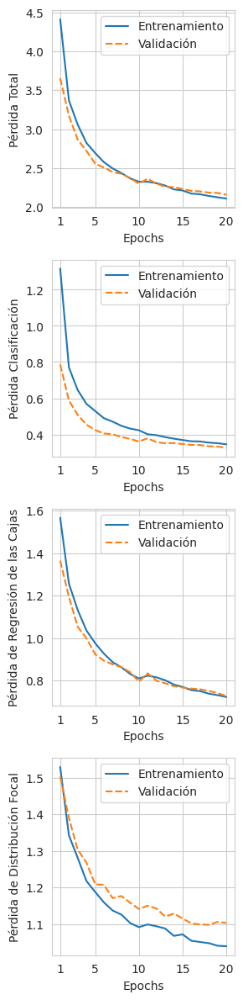

In [ ]:
plot_training_results("/content/runs/detect/train/results.csv")

##### Métricas

In [ ]:
_ = measure_fps_yolo(model, val_dataset)

FPS: 49.94


In [ ]:
_ = measure_map_yolo(model, val_dataset, iou_list=np.round(np.linspace(0.5, 0.95, 10), 2))

100%|██████████| 1627/1627 [00:33<00:00, 48.74it/s]


mAP@0.5: 0.8011
mAP@0.55: 0.7978
mAP@0.6: 0.7936
mAP@0.65: 0.7803
mAP@0.7: 0.7597
mAP@0.75: 0.7201
mAP@0.8: 0.6471
mAP@0.85: 0.4869
mAP@0.9: 0.2875
mAP@0.95: 0.0486
Average mAP: 0.6123


##### Probando el Modelo

Predecimos sobre una imagen del conjunto de validación:

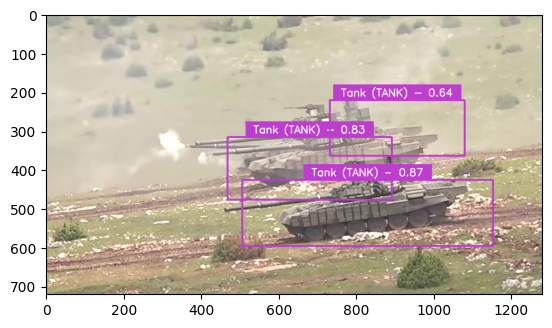

In [ ]:
image = val_dataset[0][0]
output = model.predict(image, device=0, verbose = False)
output = decode_output_yolo(output)
bbs, confs, labels = output
plot_bbox(image, bbs, confs, labels, class_colors=CLASS_COLORS)
plt.imshow(image)

In [ ]:
shutil.rmtree("/content/runs")

### Entrenamiento en el Dataset con Data Augmentation

In [ ]:
model = YOLO("yolov8m.pt")

In [ ]:
results_yolov8 = model.train(
    data="/content/od_dataset_augmented.yaml",
    epochs=20,
    device=DEVICE,
    augment=False,
    optimizer='AdamW',
    lr0=1e-4,
    lrf=1.0,
    weight_decay=1e-5,
    momentum=0.9
)

New https://pypi.org/project/ultralytics/8.3.95 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/od_dataset_augmented.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, sa

train: Scanning /content/object_detection_dataset_yolo_augmented/labels/train.cache... 22700 images, 0 backgrounds, 0 corrupt: 100%|██████████| 22700/22700 [00:00<?, ?it/s]
val: Scanning /content/object_detection_dataset_yolo_augmented/labels/val.cache... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=1e-05), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20       7.2G       1.61      1.384      1.431         50        640: 100%|██████████| 1419/1419 [07:28<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.05it/s]


                   all       1627       3941      0.855      0.742      0.836      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      7.53G      1.286     0.8055      1.236         52        640: 100%|██████████| 1419/1419 [07:16<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.00it/s]


                   all       1627       3941      0.932      0.888      0.934      0.641

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      7.53G      1.144     0.6592      1.161         71        640: 100%|██████████| 1419/1419 [07:11<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.01it/s]


                   all       1627       3941      0.958      0.921      0.958      0.688

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      7.53G      1.059     0.5873      1.118         72        640: 100%|██████████| 1419/1419 [07:08<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.02it/s]


                   all       1627       3941      0.946      0.928      0.961        0.7

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      7.53G     0.9967     0.5354      1.084         50        640: 100%|██████████| 1419/1419 [07:09<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.93it/s]


                   all       1627       3941      0.958      0.937      0.967      0.731

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      7.53G     0.9572     0.5065      1.063         54        640: 100%|██████████| 1419/1419 [07:08<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.99it/s]


                   all       1627       3941      0.955       0.94      0.972       0.75

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      7.53G     0.9267     0.4859       1.05         67        640: 100%|██████████| 1419/1419 [07:09<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.01it/s]


                   all       1627       3941      0.967      0.933      0.971      0.759

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      7.53G     0.9015     0.4671      1.036         66        640: 100%|██████████| 1419/1419 [07:08<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.00it/s]


                   all       1627       3941      0.965      0.945      0.975      0.769

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      7.53G     0.8771     0.4497      1.025         58        640: 100%|██████████| 1419/1419 [07:10<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.01it/s]


                   all       1627       3941       0.97       0.95      0.978      0.778

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      7.53G       0.86     0.4405      1.016         70        640: 100%|██████████| 1419/1419 [07:08<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.99it/s]


                   all       1627       3941      0.966       0.95      0.976      0.783
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      7.53G     0.8757     0.4206      1.027         20        640: 100%|██████████| 1419/1419 [07:07<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.04it/s]


                   all       1627       3941      0.959       0.95      0.976      0.779

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      7.53G     0.8565     0.4087      1.019         30        640: 100%|██████████| 1419/1419 [07:06<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.04it/s]


                   all       1627       3941      0.966      0.947      0.978      0.785

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      7.53G     0.8442     0.3992      1.014         28        640: 100%|██████████| 1419/1419 [07:06<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.00it/s]


                   all       1627       3941      0.971      0.952       0.98      0.798

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      7.53G     0.8279     0.3908      1.005         19        640: 100%|██████████| 1419/1419 [07:06<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.06it/s]


                   all       1627       3941      0.965      0.963      0.984      0.801

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      7.53G     0.8163     0.3851     0.9977         17        640: 100%|██████████| 1419/1419 [07:06<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.05it/s]


                   all       1627       3941      0.969      0.957      0.984      0.805

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      7.53G     0.8068     0.3803      0.989         22        640: 100%|██████████| 1419/1419 [07:07<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.97it/s]


                   all       1627       3941      0.972      0.959      0.984      0.811

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      7.53G     0.7979      0.376     0.9873         38        640: 100%|██████████| 1419/1419 [07:06<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.02it/s]


                   all       1627       3941       0.97      0.962      0.984      0.816

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      7.53G     0.7875     0.3688      0.979         30        640: 100%|██████████| 1419/1419 [07:07<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.98it/s]


                   all       1627       3941      0.966      0.966      0.985      0.821

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      7.53G     0.7784     0.3646     0.9771         36        640: 100%|██████████| 1419/1419 [07:07<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.00it/s]


                   all       1627       3941      0.968      0.965      0.984      0.825

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      7.53G     0.7722     0.3607     0.9716         12        640: 100%|██████████| 1419/1419 [07:08<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.02it/s]


                   all       1627       3941      0.971      0.965      0.986      0.824

20 epochs completed in 2.451 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 92 layers, 25,846,129 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:11<00:00,  4.51it/s]


                   all       1627       3941      0.968      0.965      0.984      0.825
           Tank (TANK)        288        663      0.992      0.988      0.994       0.86
Infantry fighting vehicle (IFV)        117        229      0.971      0.974      0.994      0.872
Armored personnel carrier (APC)        183        775      0.963      0.977      0.992      0.854
Engineering vehicle (EV)        245        280      0.998          1      0.995      0.918
Assault helicopter (AH)         84        242      0.973      0.893      0.953      0.647
Transport helicopter (TH)         83        116      0.974      0.973      0.992      0.776
Assault airplane (AAP)         80        115      0.955      0.948       0.97      0.709
Transport airplane (TA)        158        359      0.996      0.997      0.995      0.922
Anti-aircraft vehicle (AA)         56        153      0.952      0.974      0.987      0.911
Towed artillery (TART)        214        289      0.946      0.974      0.987    

#### Checkpoint

Comprimimos la carpeta runs creada de forma automática por el modelo y la guardamos en Drive. Esta carpeta, además de los resultados del entrenamiento y más información sobre el dataset, contiene el mejor de los modelos obtenidos durante el entrenamiento y el último obtenido.

In [ ]:
shutil.make_archive(
    "/content/runs",
    "zip",
    "/content",
    "runs"
)

'/content/runs.zip'

In [ ]:
shutil.copy(
    "/content/runs.zip",
    "/content/drive/MyDrive/tfg/runs_yolov8_augmented.zip"
)

'/content/drive/MyDrive/tfg/runs_yolov8_augmented.zip'

In [ ]:
shutil.rmtree("/content/runs")

#### Resultados

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov8_augmented.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

In [ ]:
model = YOLO("runs/detect/train/weights/best.pt")

##### Pérdida

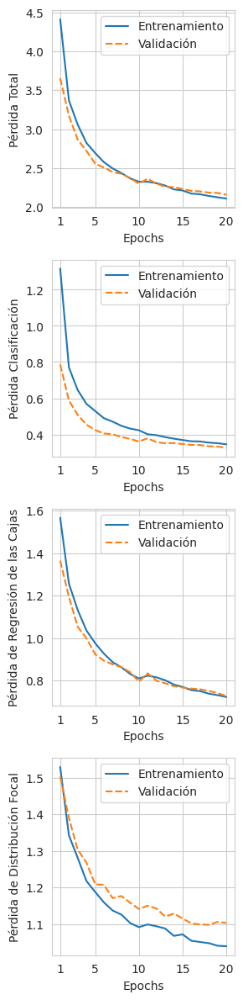

In [ ]:
plot_training_results("/content/runs/detect/train/results.csv")

##### Métricas

In [ ]:
_ = measure_fps_yolo(model, val_dataset)

FPS: 49.56


In [ ]:
_ = measure_map_yolo(model, val_dataset, iou_list=np.round(np.linspace(0.5, 0.95, 10), 2))

100%|██████████| 1627/1627 [00:32<00:00, 49.78it/s]


mAP@0.5: 0.6512
mAP@0.55: 0.6472
mAP@0.6: 0.6391
mAP@0.65: 0.6321
mAP@0.7: 0.6130
mAP@0.75: 0.5738
mAP@0.8: 0.5041
mAP@0.85: 0.3831
mAP@0.9: 0.2151
mAP@0.95: 0.0391
Average mAP: 0.4898


##### Probando el Modelo

Predecimos sobre una imagen del conjunto de validación:

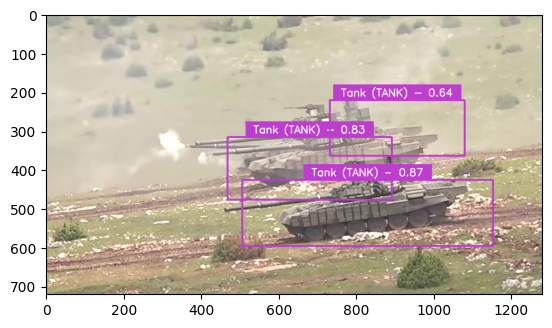

In [ ]:
image = val_dataset[0][0]
output = model.predict(image, device=0, verbose = False)
output = decode_output_yolo(output)
bbs, confs, labels = output
plot_bbox(image, bbs, confs, labels, class_colors=CLASS_COLORS)
plt.imshow(image)

In [ ]:
shutil.rmtree("/content/runs")

### Entrenamiento en el Dataset con Data Augmentation y Fotos de Humanos

In [ ]:
model = YOLO("yolov8m.pt")

In [ ]:
results_yolov8 = model.train(
    data="/content/od_dataset_augmented_humans.yaml",
    epochs=20,
    device=DEVICE,
    augment=False,
    optimizer='AdamW',
    lr0=1e-4,
    lrf=1.0,
    weight_decay=1e-5,
    momentum=0.9
)

New https://pypi.org/project/ultralytics/8.3.95 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/od_dataset_augmented_humans.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=Fa

train: Scanning /content/object_detection_dataset_yolo_augmented_humans/labels/train.cache... 23986 images, 0 backgrounds, 0 corrupt: 100%|██████████| 23986/23986 [00:00<?, ?it/s]
val: Scanning /content/object_detection_dataset_yolo_augmented_humans/labels/val.cache... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=1e-05), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      6.98G      1.674      1.429      1.415          6        640: 100%|██████████| 1500/1500 [07:56<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.05it/s]


                   all       1627       3941      0.889      0.828      0.891      0.541

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      6.98G      1.364     0.8641       1.23         13        640: 100%|██████████| 1500/1500 [07:41<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.02it/s]


                   all       1627       3941      0.945      0.899      0.943      0.651

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      6.98G      1.226      0.712      1.161         15        640: 100%|██████████| 1500/1500 [07:35<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.05it/s]


                   all       1627       3941      0.954      0.911      0.954      0.672

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      6.98G       1.15     0.6363      1.127          5        640: 100%|██████████| 1500/1500 [07:33<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.05it/s]


                   all       1627       3941      0.964      0.921       0.96       0.71

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      6.98G      1.088     0.5845      1.095          2        640: 100%|██████████| 1500/1500 [07:34<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.04it/s]


                   all       1627       3941      0.958      0.933      0.965      0.726

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      6.98G      1.048     0.5564       1.08          9        640: 100%|██████████| 1500/1500 [07:33<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.07it/s]


                   all       1627       3941      0.961      0.938      0.969      0.746

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      6.98G      1.016     0.5354      1.068          3        640: 100%|██████████| 1500/1500 [07:34<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.08it/s]


                   all       1627       3941      0.962      0.937      0.971      0.757

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      6.98G     0.9851     0.5125      1.056         11        640: 100%|██████████| 1500/1500 [07:33<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.03it/s]


                   all       1627       3941       0.97       0.94      0.977      0.765

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      6.98G     0.9715     0.5001      1.047         10        640: 100%|██████████| 1500/1500 [07:34<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.02it/s]


                   all       1627       3941      0.964      0.949      0.976      0.775

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      6.98G     0.9503     0.4858      1.039         28        640: 100%|██████████| 1500/1500 [07:33<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.05it/s]


                   all       1627       3941      0.958      0.951      0.975      0.774
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      6.98G     0.9695     0.4684      1.046          3        640: 100%|██████████| 1500/1500 [07:32<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.04it/s]


                   all       1627       3941      0.959      0.957      0.979      0.785

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      6.98G     0.9482      0.455      1.035          6        640: 100%|██████████| 1500/1500 [07:31<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.02it/s]


                   all       1627       3941       0.97      0.946       0.98      0.789

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      6.98G     0.9327     0.4455       1.03         14        640: 100%|██████████| 1500/1500 [07:31<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.83it/s]


                   all       1627       3941      0.963      0.961      0.981      0.798

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      6.98G     0.9243     0.4431      1.027          2        640: 100%|██████████| 1500/1500 [07:32<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.03it/s]


                   all       1627       3941      0.968      0.961      0.982      0.799

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      6.98G     0.9061     0.4292      1.019          2        640: 100%|██████████| 1500/1500 [07:31<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.05it/s]


                   all       1627       3941      0.967      0.959      0.982      0.806

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      6.98G     0.8941     0.4224      1.015          4        640: 100%|██████████| 1500/1500 [07:32<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.01it/s]

                   all       1627       3941      0.969      0.963      0.985      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      6.98G     0.8883     0.4212      1.014          4        640: 100%|██████████| 1500/1500 [07:31<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.04it/s]


                   all       1627       3941      0.965      0.965      0.985      0.813

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      6.98G     0.8799     0.4158      1.006          3        640: 100%|██████████| 1500/1500 [07:31<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.05it/s]


                   all       1627       3941      0.969      0.965      0.985      0.817

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      6.98G      0.867     0.4087      0.999          2        640: 100%|██████████| 1500/1500 [07:31<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.05it/s]


                   all       1627       3941      0.971      0.962      0.986      0.822

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      6.98G     0.8591      0.404     0.9961          4        640: 100%|██████████| 1500/1500 [07:32<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  5.05it/s]


                   all       1627       3941      0.972      0.966      0.986      0.825

20 epochs completed in 2.591 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 92 layers, 25,846,708 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:11<00:00,  4.46it/s]


                   all       1627       3941      0.971      0.966      0.987      0.824
           Tank (TANK)        288        663      0.983      0.982      0.994      0.855
Infantry fighting vehicle (IFV)        117        229      0.982       0.98      0.993      0.873
Armored personnel carrier (APC)        183        775      0.976      0.981      0.993      0.865
Engineering vehicle (EV)        245        280      0.998          1      0.995      0.904
Assault helicopter (AH)         84        242      0.968      0.905      0.962      0.663
Transport helicopter (TH)         83        116      0.974       0.97      0.991      0.774
Assault airplane (AAP)         80        115      0.947      0.957      0.981      0.697
Transport airplane (TA)        158        359      0.995      0.997      0.995      0.923
Anti-aircraft vehicle (AA)         56        153      0.968      0.967      0.991      0.918
Towed artillery (TART)        214        289      0.958      0.972      0.987    

#### Checkpoint

Comprimimos la carpeta runs creada de forma automática por el modelo y la guardamos en Drive. Esta carpeta, además de los resultados del entrenamiento y más información sobre el dataset, contiene el mejor de los modelos obtenidos durante el entrenamiento y el último obtenido.

In [ ]:
shutil.make_archive(
    "/content/runs",
    "zip",
    "/content",
    "runs"
)

'/content/runs.zip'

In [ ]:
shutil.copy(
    "/content/runs.zip",
    "/content/drive/MyDrive/tfg/runs_yolov8_augmented_humans.zip"
)

'/content/drive/MyDrive/tfg/runs_yolov8_augmented_humans.zip'

In [ ]:
shutil.rmtree("/content/runs")

#### Resultados

In [ ]:
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov8_augmented_humans.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"

In [ ]:
model = YOLO("runs/detect/train/weights/best.pt")

##### Pérdida

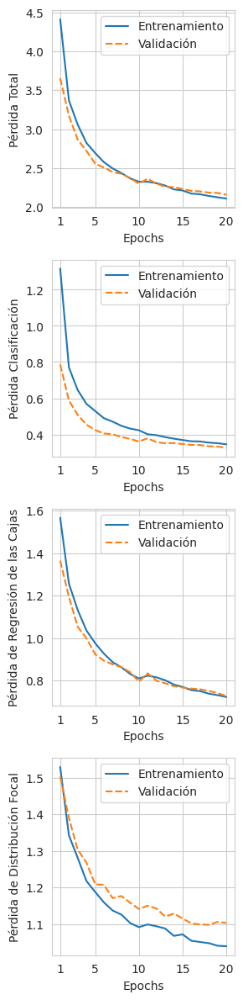

In [ ]:
plot_training_results("/content/runs/detect/train/results.csv")

##### Métricas

In [ ]:
_ = measure_fps_yolo(model, val_dataset)

FPS: 49.53


In [ ]:
_ = measure_map_yolo(model, val_dataset, iou_list=np.round(np.linspace(0.5, 0.95, 10), 2))

100%|██████████| 1627/1627 [00:32<00:00, 49.56it/s]


mAP@0.5: 0.6452
mAP@0.55: 0.6422
mAP@0.6: 0.6336
mAP@0.65: 0.6231
mAP@0.7: 0.6014
mAP@0.75: 0.5639
mAP@0.8: 0.5035
mAP@0.85: 0.3895
mAP@0.9: 0.2140
mAP@0.95: 0.0244
Average mAP: 0.4841


##### Probando el Modelo

Predecimos sobre una imagen del conjunto de validación:

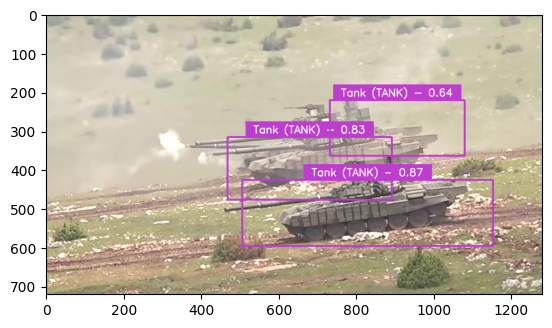

In [ ]:
image = val_dataset[0][0]
output = model.predict(image, device=0, verbose = False)
output = decode_output_yolo(output)
bbs, confs, labels = output
plot_bbox(image, bbs, confs, labels, class_colors=CLASS_COLORS)
plt.imshow(image)

In [ ]:
shutil.rmtree("/content/runs")

### Comparación de la Evolución de los modelos

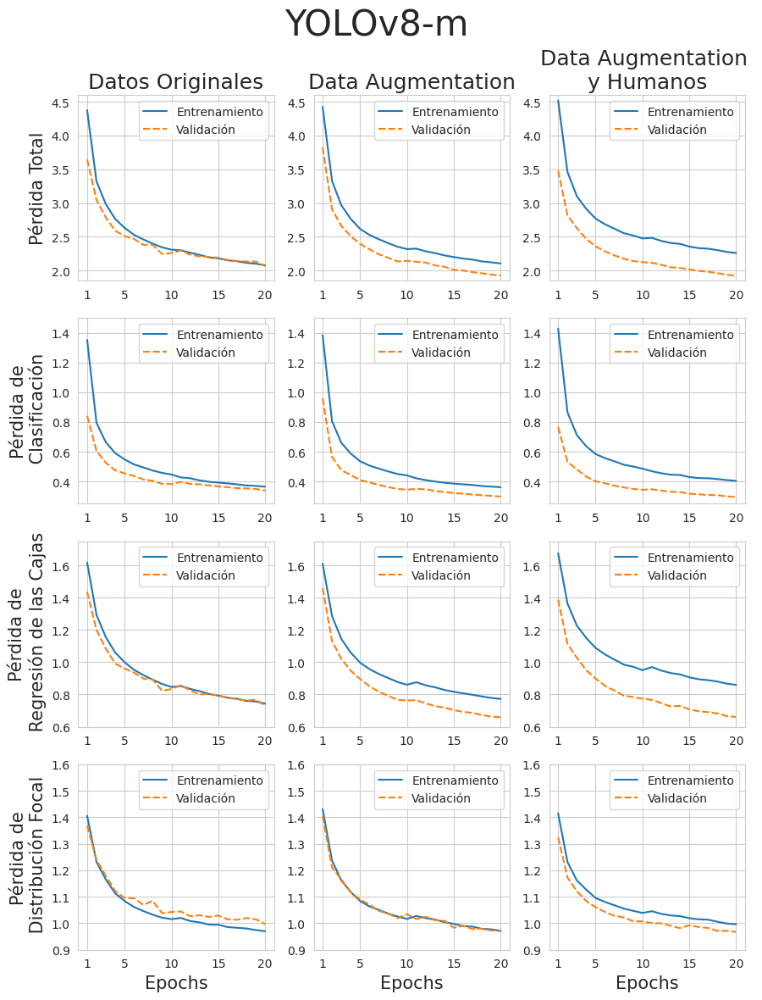

In [ ]:
# Sin data augmentation ni humanos
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov8.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"
yolov8_results = pd.read_csv("/content/runs/detect/train/results.csv")
shutil.rmtree("/content/runs")

# Con data augmentation
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov8_augmented.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"
yolov8_augmented_results = pd.read_csv("/content/runs/detect/train/results.csv")
shutil.rmtree("/content/runs")

# Con data augmentation y humanos
zip_path = "/content/drive/MyDrive/tfg/models/runs_yolov8_augmented_humans.zip"
extract_path = "/content/"
!unzip -q "$zip_path" -d "$extract_path"
yolov8_augmented_humans_results = pd.read_csv("/content/runs/detect/train/results.csv")
shutil.rmtree("/content/runs")

plot_all_training_results(
    yolov8_results,
    yolov8_augmented_results,
    yolov8_augmented_humans_results,
    "YOLOv8-m"
)